In [12]:
from SVDModel import SVDModel, topKPrediction,movieRatePredictionByUserIdMovieId
import pandas as pd
import numpy as np
import seaborn as sns
import matplotlib.pyplot as plt
import time
from joblib import Parallel, delayed
import pickle
import os.path
from pathlib import Path

np.random.seed(3362)

In [2]:
# Parameters
PARAM = dict()
PARAM['path'] = {
  'ml':'./data/MovieLens25M/',
  'netflix':'./data/NetflixPrize/'
}

PARAM

{'path': {'ml': './data/MovieLens25M/', 'netflix': './data/NetflixPrize/'}}

In [3]:
ML_25M = {}
hasReindex = True
try:
  ML_25M['ratings'] = pd.read_csv(PARAM['path']['ml']+'ratings_newMovieId_no_index.csv')
except:
  hasReindex = False
  ML_25M['ratings'] = pd.read_csv(PARAM['path']['ml']+'ratings.csv')

ML_25M['movies'] = pd.read_csv(PARAM['path']['ml']+'movies.csv')

ML_25M['movies'].insert(1, 'newMovieId', value=range(1,len(ML_25M['movies'])+1))
newMovieIdDict = {}
for index, movie in ML_25M['movies'].iterrows():
    newMovieIdDict[movie['movieId']] = movie['newMovieId']

if not hasReindex:
  ML_25M['ratings_reindex'] = ML_25M['ratings']

  for index, rating in ML_25M['ratings'].iterrows():
    if index % 1000000 == 0: print('{}/{}'.format(index, len(ML_25M['ratings'])))
    ML_25M['ratings_reindex'].at[index, 'movieId'] = newMovieIdDict[rating['movieId']]

  ML_25M['ratings_reindex'].to_csv(PARAM['path']['ml']+'ratings_newMovieId_no_index.csv', index = False)

  ML_25M['ratings'] = ML_25M['ratings_reindex']

ML_25M['movies'].drop(columns=['movieId'], inplace=True)
ML_25M['movies'].rename(columns={"newMovieId": "movieId"}, inplace=True)

ML_25M['ratings'] = ML_25M['ratings'].sort_values(by=['userId'])
ML_25M['movies'] = ML_25M['movies'].sort_values(by=['movieId'])

In [4]:
maxNumberOfUser = 50000
maxNumberOfMovie = 20000

maxNumberOfReview = ML_25M['ratings'][ML_25M['ratings']['userId'] == maxNumberOfUser].index[-1]
ML_25M['ratings'] = ML_25M['ratings'][:maxNumberOfReview]

ML_25M['movies'] = ML_25M['movies'][:maxNumberOfMovie]

# inner join by movieId
ML_25M['ratings'] = ML_25M['ratings'].merge(ML_25M['movies'], on='movieId')[['userId', 'movieId', 'rating']]
ML_25M['ratings']

ML_25M['m_movies'] = ML_25M['movies']['movieId'].nunique()
ML_25M['n_users'] = ML_25M['ratings']['userId'].nunique()
ML_25M['n_ratings'] = len(ML_25M['ratings'])

ML_25M['ratings']['userId'] = ML_25M['ratings']['userId'].astype(np.int32)
ML_25M['ratings']['movieId'] = ML_25M['ratings']['movieId'].astype(np.int32)
ML_25M['ratings']['rating'] = ML_25M['ratings']['rating'].astype(np.float32)

ML_25M

{'ratings':          userId  movieId  rating
 0             1      293     5.0
 1             3      293     5.0
 2             4      293     4.0
 3             5      293     4.0
 4             7      293     4.0
 ...         ...      ...     ...
 7213863   49403     5033     0.5
 7213864   49631    19610     4.0
 7213865   49879    19188     0.5
 7213866   49901    19862     1.0
 7213867   49901    17840     1.0
 
 [7213868 rows x 3 columns],
 'movies':        movieId                                        title  \
 0            1                             Toy Story (1995)   
 1            2                               Jumanji (1995)   
 2            3                      Grumpier Old Men (1995)   
 3            4                     Waiting to Exhale (1995)   
 4            5           Father of the Bride Part II (1995)   
 ...        ...                                          ...   
 19995    19996                                 Joker (2012)   
 19996    19997             

In [5]:
print(ML_25M['ratings'].shape)
print(ML_25M['movies'].shape)

(7213868, 3)
(20000, 3)


In [6]:
data = 'ML_25M'

print('Creating SVD Model')
svd = SVDModel(
    mode='svd++',
    # features=features, 
    # lr=lr, 
    # epochs=epochs, 
    # weight_decay=weight_decay, 
    # stopping=PARAM['stopping']
)
print("Created\nLoading Data")
if data=='ML_25M':
    svd.data_loader(data=ML_25M['ratings'], 
                    n_items = ML_25M['m_movies'], 
                    n_users= ML_25M['n_users'])
else:
    svd.data_loader(data=NETFLIX['ratings'], 
                    n_items = NETFLIX['m_movies'], 
                    n_users= NETFLIX['n_users'])
print("Loaded Data\nSpliting Data")
svd.split(0.6,0.8)
print("Splitted Data\nTraining...")

Creating SVD Model
Created
Loading Data
Loaded Data
Spliting Data
User Item Matrix Shape: userItemMatrix.shape
User Reference length: self.n_users
Item Reference length: self.n_items
Splitted Data
Training...


In [7]:
PARAM['features'] = [3, 30, 150, 300]
PARAM['lr'] = [1e-2, 1e-3, 1e-4]
PARAM['epochs'] = [11, 101, 201, 301, 501]
PARAM['weight_decay'] = [0.02, 0.2, 2]
PARAM['stopping'] = 0.001

if data=='ML_25M':
    resultDir = 'model_movielens'
else:
    resultDir = 'model_netflix'

def train_model(features, lr, epochs, data, weight_decay):
    if os.path.isfile(f'./{resultDir}/svdpp/model/{features}_{lr}_{epochs}_{weight_decay}_0.001.pkl'):
        with open(f'./{resultDir}/svdpp/model/{features}_{lr}_{epochs}_{weight_decay}_0.001.pkl', 'rb') as inp:
            loaded_svd = pickle.load(inp)
            print('Found existing model loaded it')
        with open(f'./{resultDir}/svdpp/result/{features}_{lr}_{epochs}_0.02_0.001.pkl', 'rb') as inp:
            loaded_result = pickle.load(inp)
            print('Found existing result loaded it')
        return loaded_svd, loaded_result
    
    svd.features = features
    svd.lr = lr
    svd.epochs = epochs
    # svd.data = data
    svd.weight_decay = weight_decay
    svd.stopping = PARAM['stopping']

    print(f"==============================")
    print(f'features: {svd.features}\nlearning rate: {svd.lr}\nEpochs: {svd.epochs}\nweight decay: {svd.weight_decay}\nstopping: {svd.stopping}\n')
    
    start = time.perf_counter()
    result = svd.training()
    print('Time used =', time.perf_counter()-start)
    
    print('Saving Model')
    # svd.data = []
    Path(f"./{resultDir}").mkdir(parents=True, exist_ok=True)
    Path(f"./{resultDir}/svdpp/").mkdir(parents=True, exist_ok=True)
    Path(f"./{resultDir}/svdpp/model/").mkdir(parents=True, exist_ok=True)
    Path(f"./{resultDir}/svdpp/result/").mkdir(parents=True, exist_ok=True)
    
    with open(f'./{resultDir}/svdpp/model/{features}_{lr}_{epochs}_{weight_decay}_0.001.pkl', 'wb') as out:
        pickle.dump(svd, out, pickle.HIGHEST_PROTOCOL)
    with open(f'./{resultDir}/svdpp/result/{features}_{lr}_{epochs}_{weight_decay}_0.001.pkl', 'wb') as out:
        pickle.dump(result, out, pickle.HIGHEST_PROTOCOL)
    print(f"==============================")
    return svd, result

In [8]:
for epochs in PARAM['epochs']:
    for features in PARAM['features']:
        for lr in PARAM['lr']:            
            for weight_decay in PARAM['weight_decay']:
                for data in ['ML_25M']:
                    train_model(features, lr, epochs, data, weight_decay)

features: 300
learning rate: 0.01
Epochs: 301
weight decay: 0.02
stopping: 0.001

Epoch :    1  | Train : 0.813  | Valid : 0.832  | Time : 11.03481s
Epoch :   11  | Train : 0.344  | Valid : 0.645  | Time : 24.78101s
Training stopped:
Epoch :   13  | Train Loss : 0.275  | Valid Loss: 0.644  | Test Loss: 0.644
Time used = 45.216857700000006
Saving Model


# Graph
$$MSE=\frac{1}{N}\sum_{i=1}^N(predict_i-actual_i)^2$$
$$RMSE=\sqrt{\frac{\sum_{i=1}^N(predict_i-actual_i)^2}{N}}$$

features: 3
learning rate: 0.01
Epochs: 11
weight decay: 0.02
stopping: 0.001



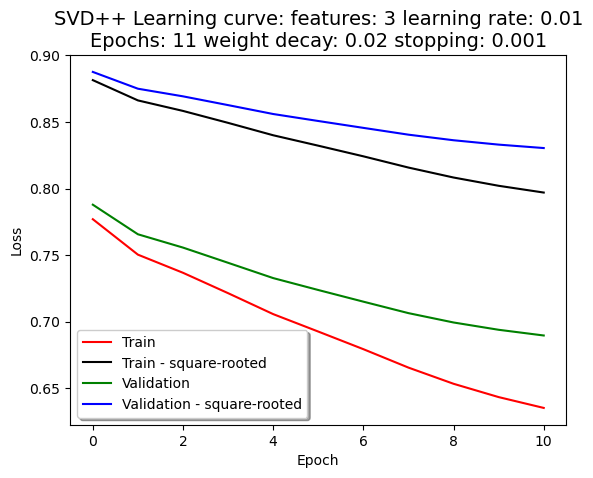

features: 3
learning rate: 0.01
Epochs: 11
weight decay: 0.2
stopping: 0.001



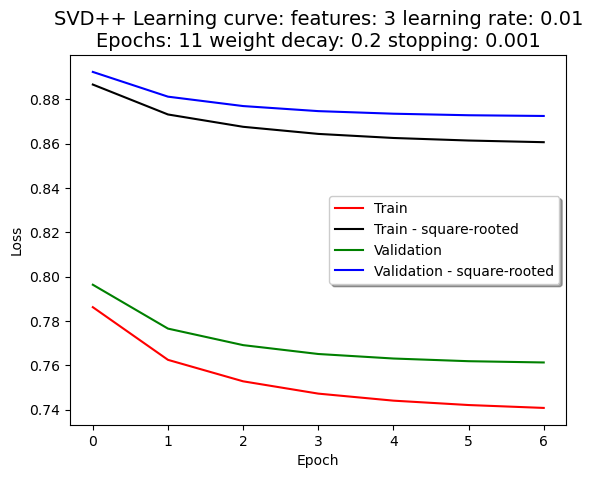

features: 3
learning rate: 0.01
Epochs: 11
weight decay: 2
stopping: 0.001



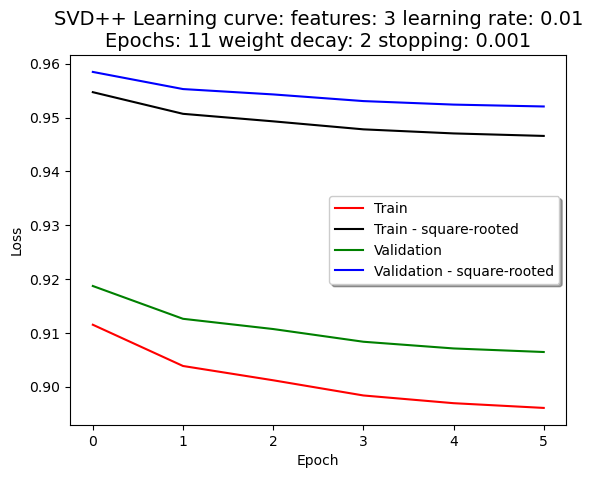

features: 3
learning rate: 0.001
Epochs: 11
weight decay: 0.02
stopping: 0.001



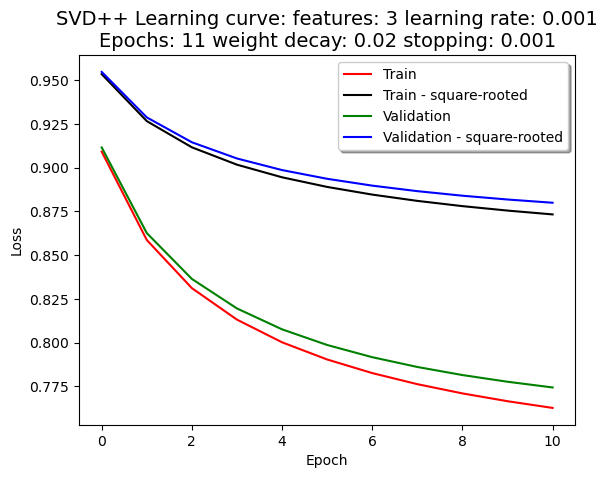

features: 3
learning rate: 0.001
Epochs: 11
weight decay: 0.2
stopping: 0.001



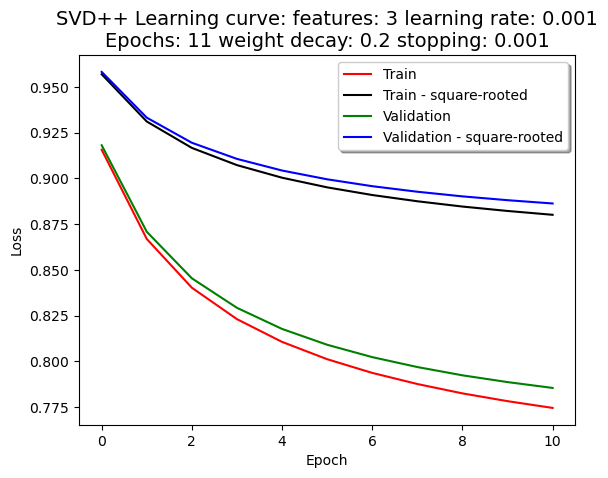

features: 3
learning rate: 0.001
Epochs: 11
weight decay: 2
stopping: 0.001



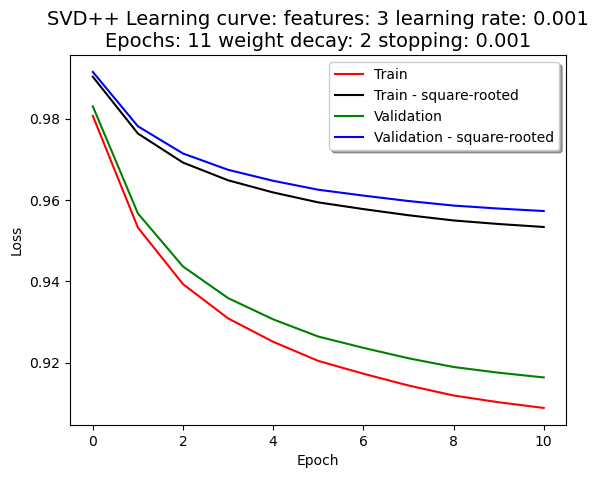

features: 3
learning rate: 0.0001
Epochs: 11
weight decay: 0.02
stopping: 0.001



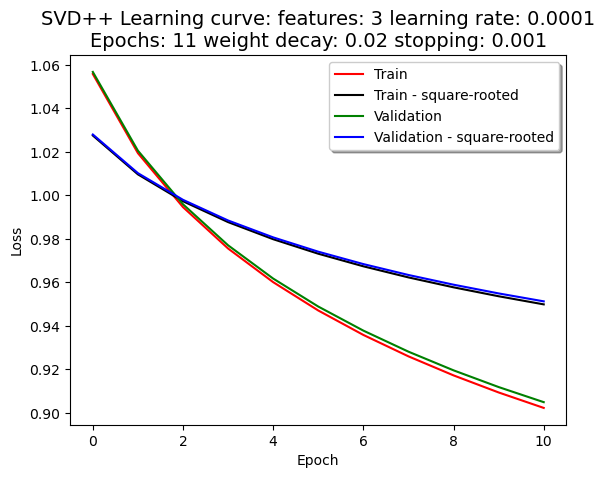

features: 3
learning rate: 0.0001
Epochs: 11
weight decay: 0.2
stopping: 0.001



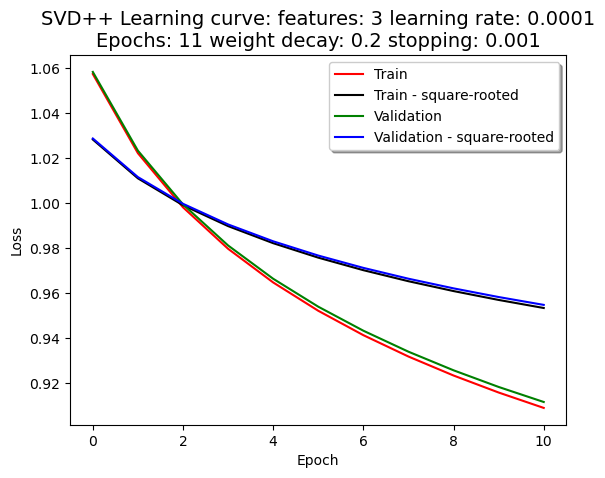

features: 3
learning rate: 0.0001
Epochs: 11
weight decay: 2
stopping: 0.001



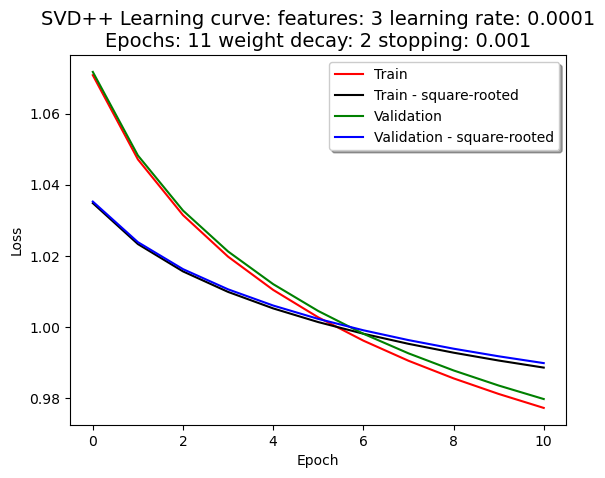

features: 30
learning rate: 0.01
Epochs: 11
weight decay: 0.02
stopping: 0.001



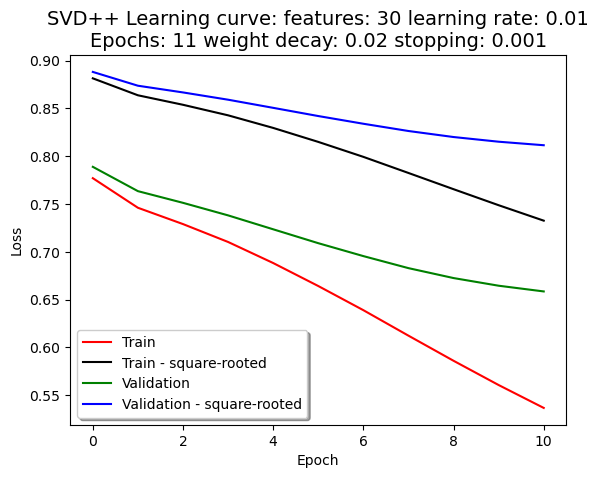

features: 30
learning rate: 0.01
Epochs: 11
weight decay: 0.2
stopping: 0.001



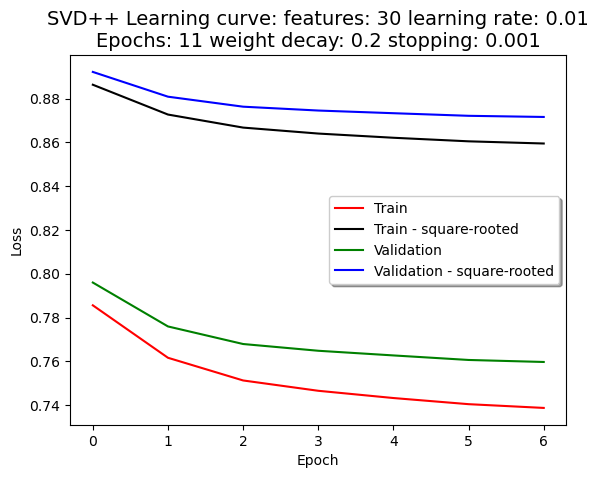

features: 30
learning rate: 0.01
Epochs: 11
weight decay: 2
stopping: 0.001



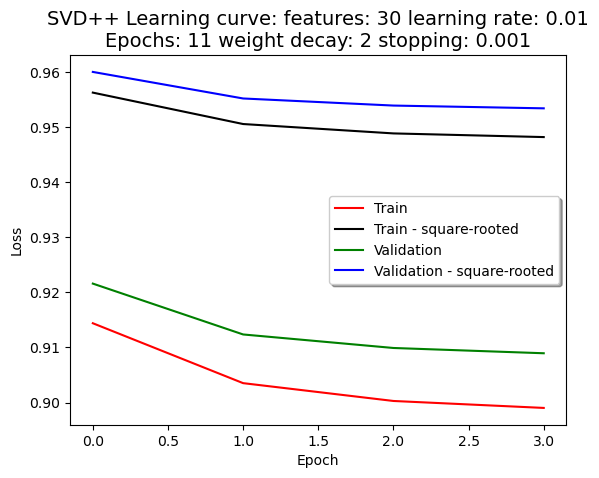

features: 30
learning rate: 0.001
Epochs: 11
weight decay: 0.02
stopping: 0.001



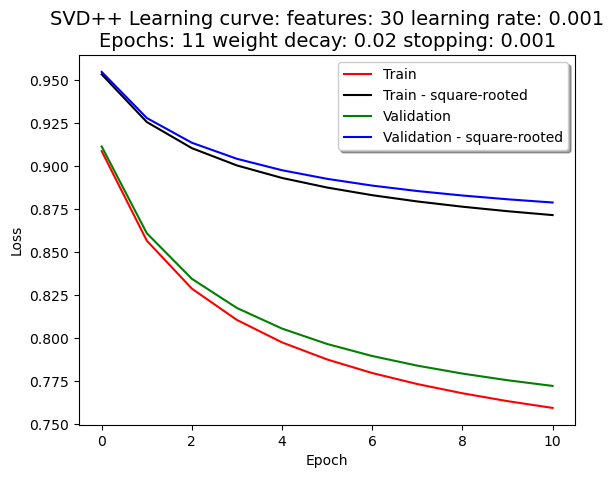

features: 30
learning rate: 0.001
Epochs: 11
weight decay: 0.2
stopping: 0.001



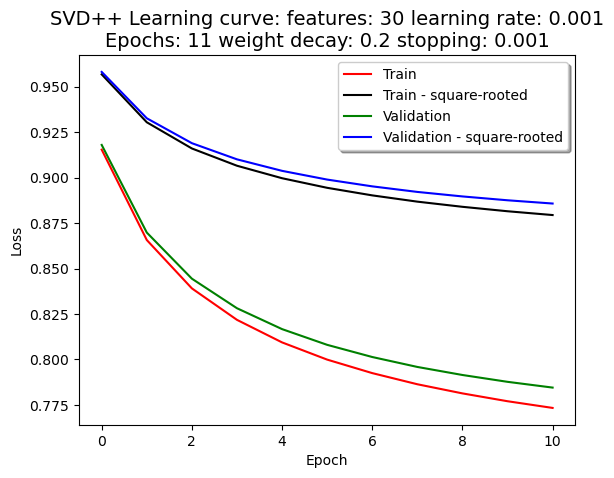

features: 30
learning rate: 0.001
Epochs: 11
weight decay: 2
stopping: 0.001



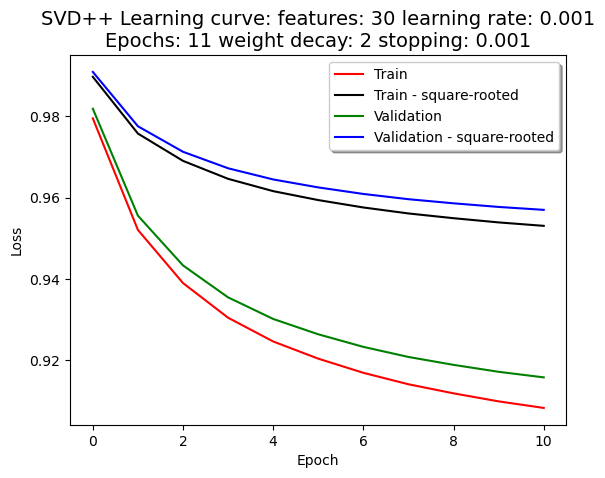

features: 30
learning rate: 0.0001
Epochs: 11
weight decay: 0.02
stopping: 0.001



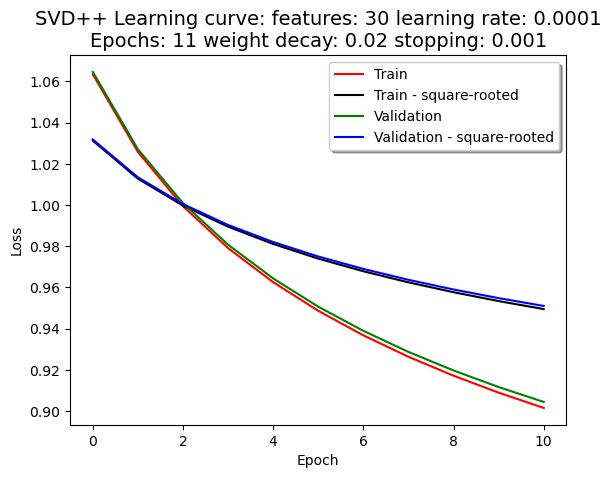

features: 30
learning rate: 0.0001
Epochs: 11
weight decay: 0.2
stopping: 0.001



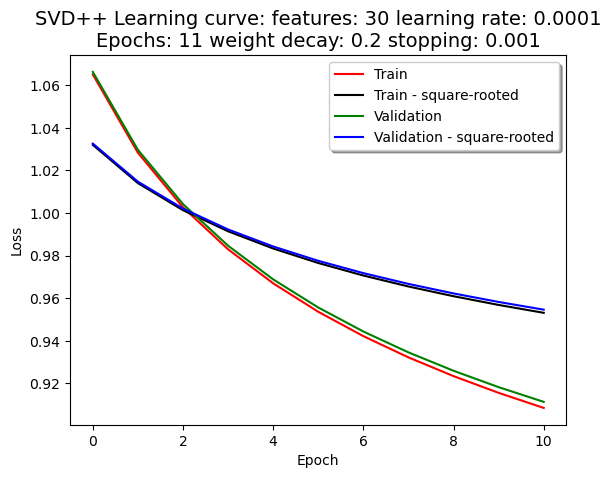

features: 30
learning rate: 0.0001
Epochs: 11
weight decay: 2
stopping: 0.001



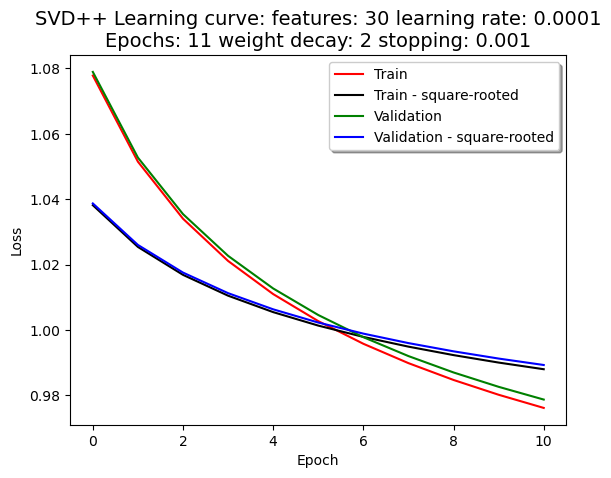

features: 150
learning rate: 0.01
Epochs: 11
weight decay: 0.02
stopping: 0.001



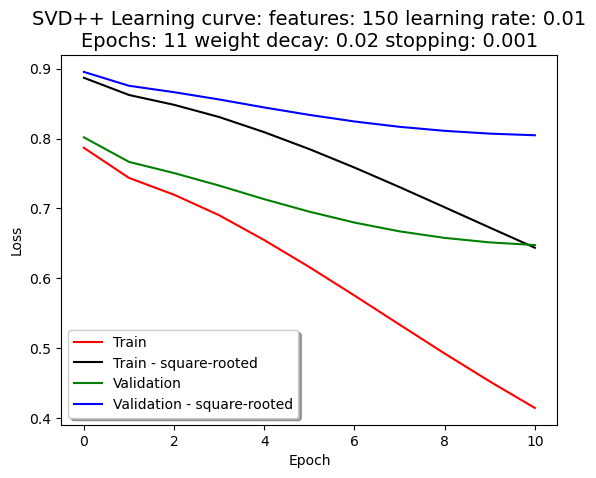

features: 150
learning rate: 0.01
Epochs: 11
weight decay: 0.2
stopping: 0.001



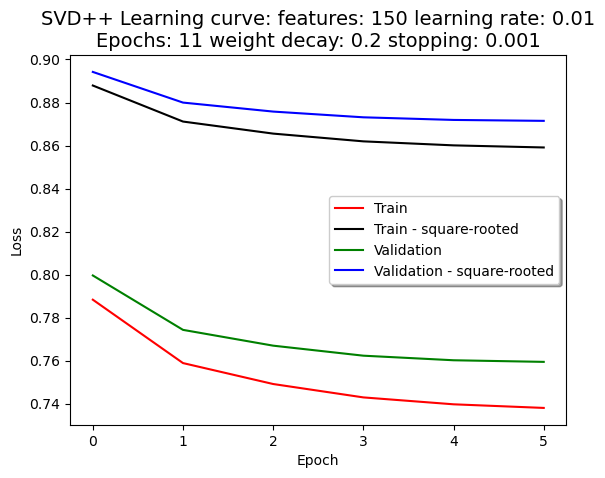

features: 150
learning rate: 0.01
Epochs: 11
weight decay: 2
stopping: 0.001



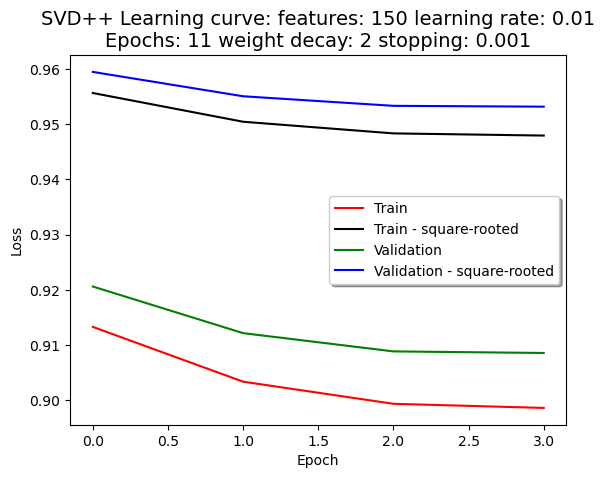

features: 150
learning rate: 0.001
Epochs: 11
weight decay: 0.02
stopping: 0.001



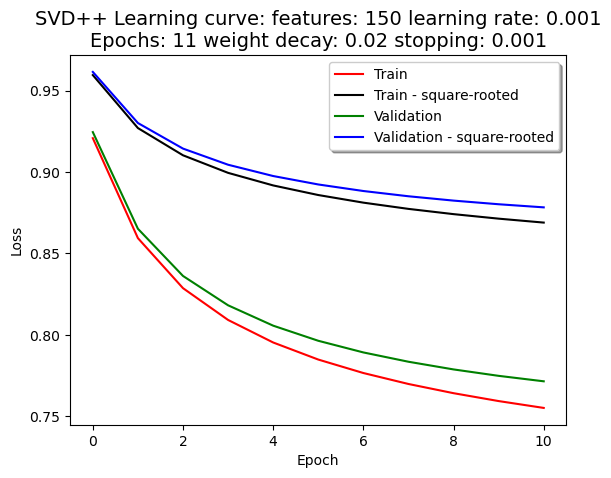

features: 150
learning rate: 0.001
Epochs: 11
weight decay: 0.2
stopping: 0.001



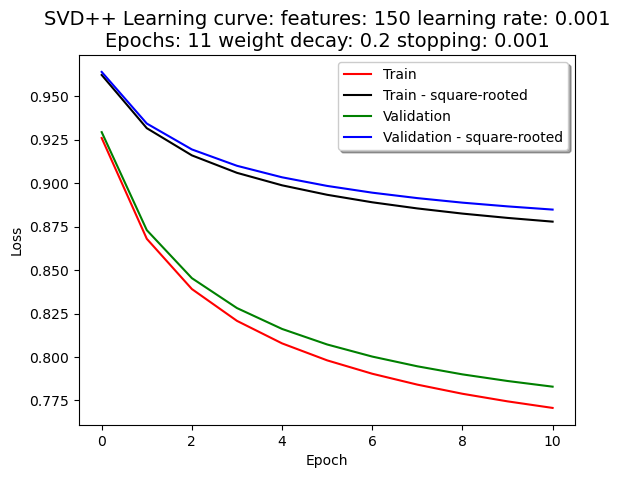

features: 150
learning rate: 0.001
Epochs: 11
weight decay: 2
stopping: 0.001



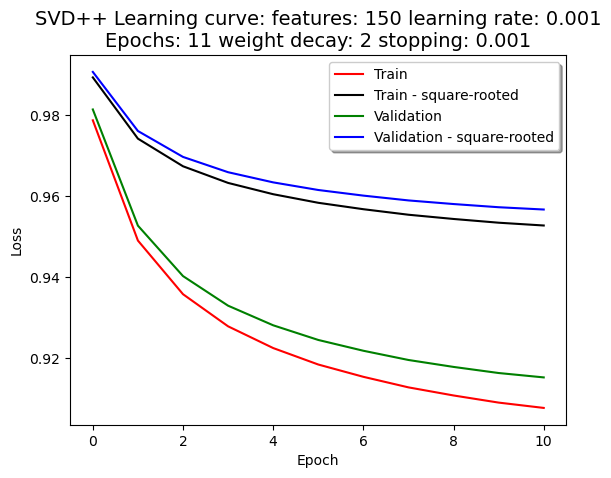

features: 150
learning rate: 0.0001
Epochs: 11
weight decay: 0.02
stopping: 0.001



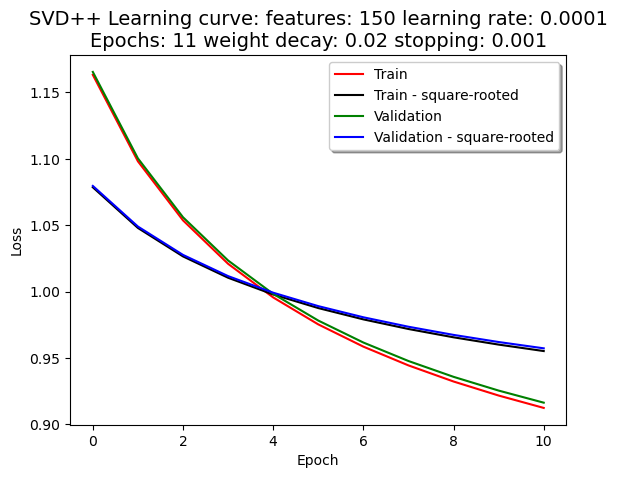

features: 150
learning rate: 0.0001
Epochs: 11
weight decay: 0.2
stopping: 0.001



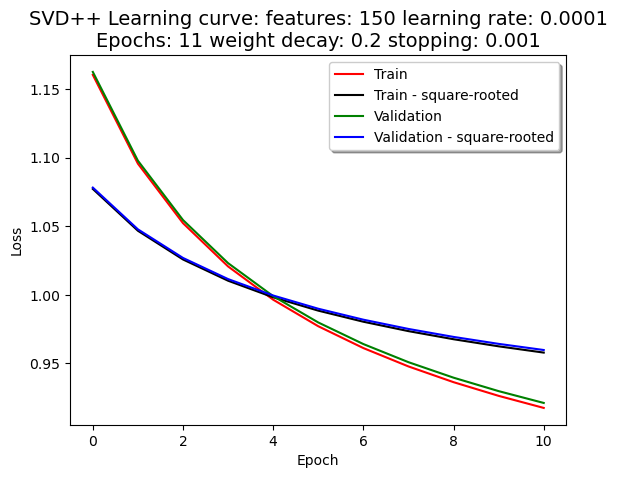

features: 150
learning rate: 0.0001
Epochs: 11
weight decay: 2
stopping: 0.001



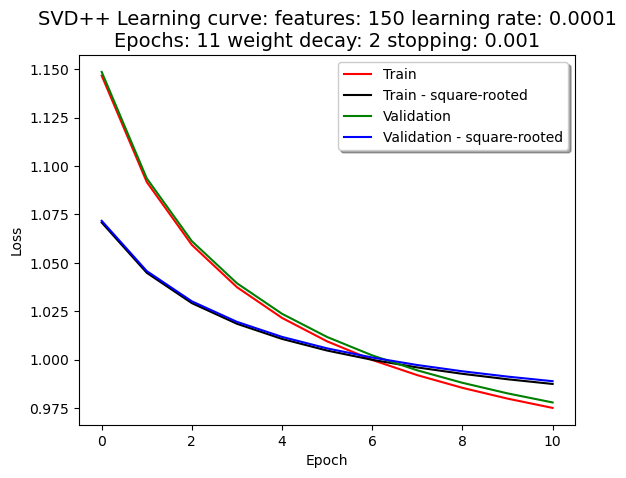

features: 300
learning rate: 0.01
Epochs: 11
weight decay: 0.02
stopping: 0.001



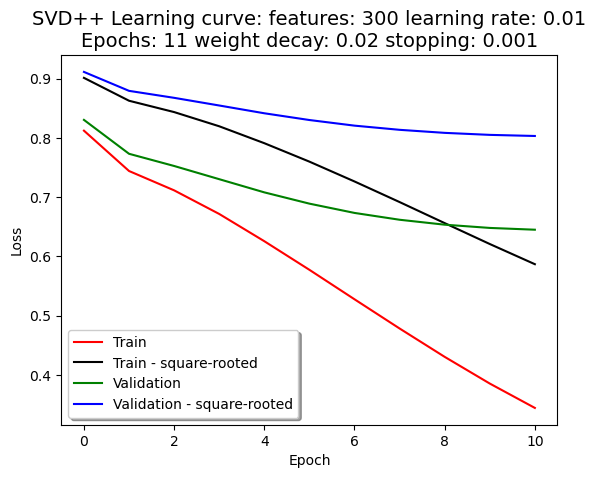

features: 300
learning rate: 0.01
Epochs: 11
weight decay: 0.2
stopping: 0.001



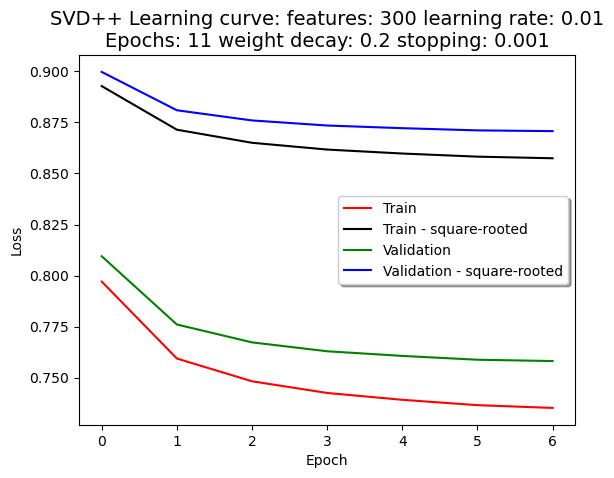

features: 300
learning rate: 0.01
Epochs: 11
weight decay: 2
stopping: 0.001



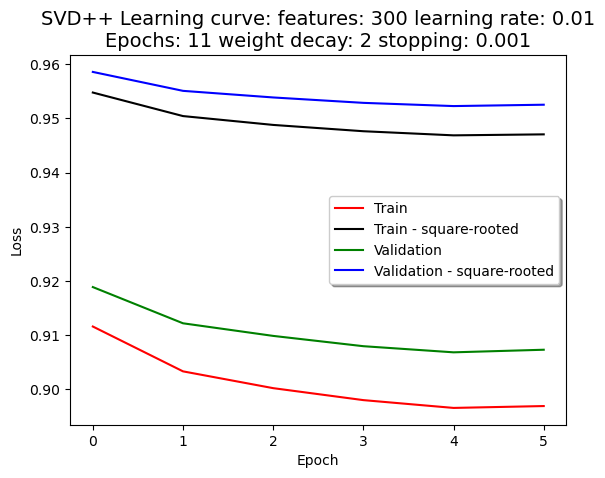

features: 300
learning rate: 0.001
Epochs: 11
weight decay: 0.02
stopping: 0.001



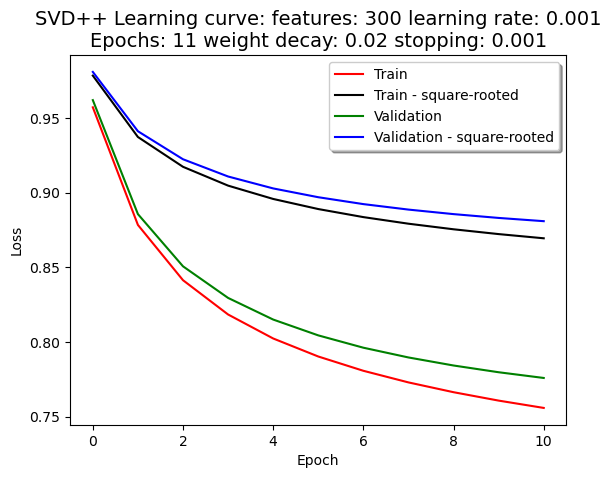

features: 300
learning rate: 0.001
Epochs: 11
weight decay: 0.2
stopping: 0.001



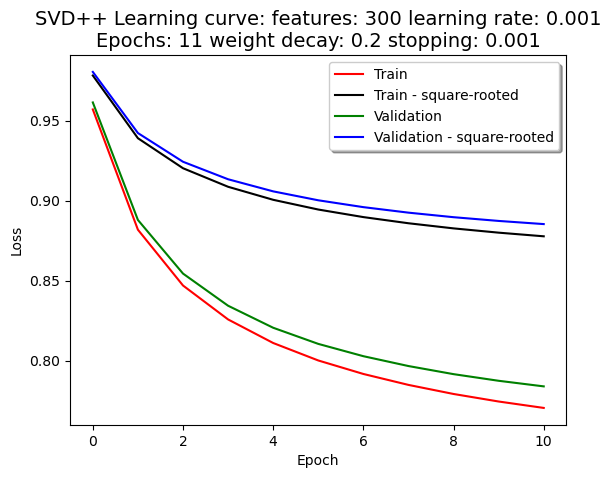

features: 300
learning rate: 0.001
Epochs: 11
weight decay: 2
stopping: 0.001



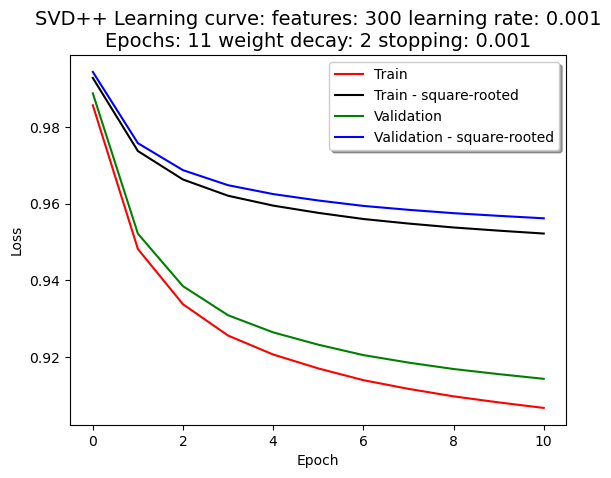

features: 300
learning rate: 0.0001
Epochs: 11
weight decay: 0.02
stopping: 0.001



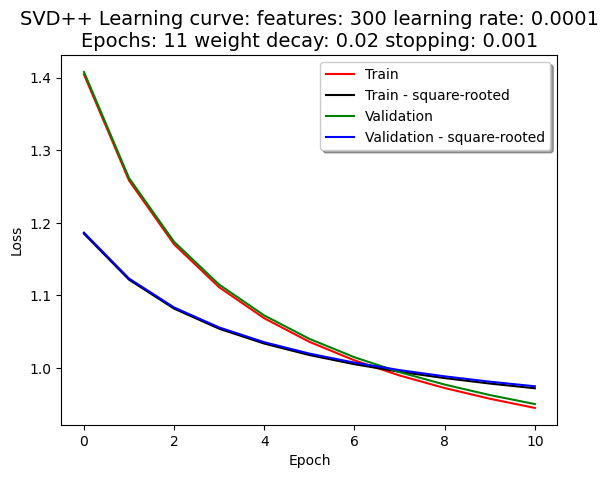

features: 300
learning rate: 0.0001
Epochs: 11
weight decay: 0.2
stopping: 0.001



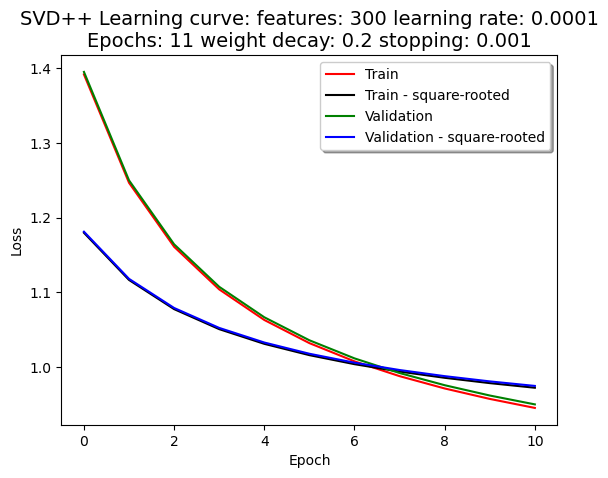

features: 300
learning rate: 0.0001
Epochs: 11
weight decay: 2
stopping: 0.001



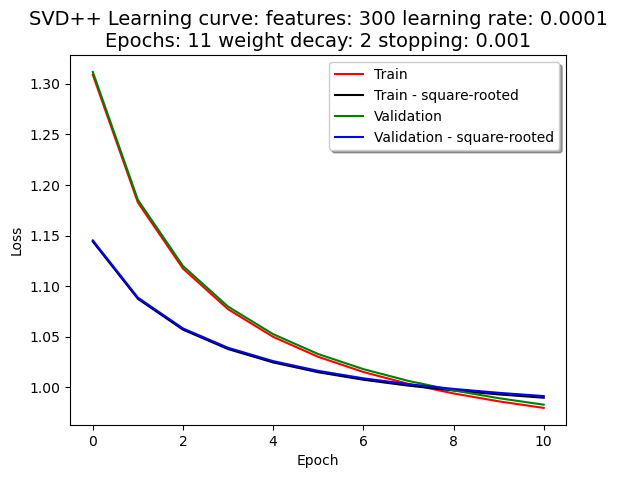

features: 3
learning rate: 0.01
Epochs: 101
weight decay: 0.02
stopping: 0.001



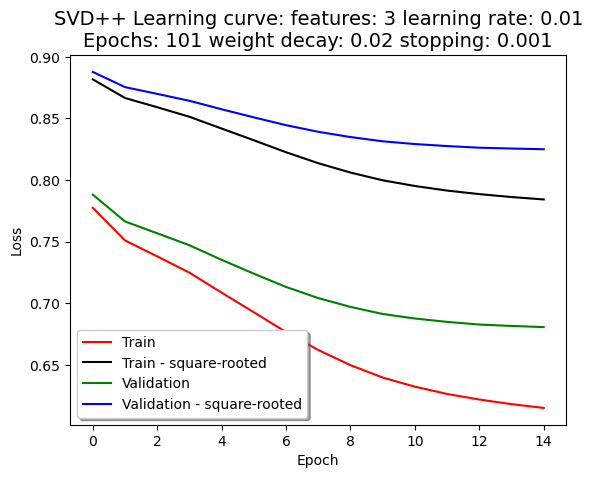

features: 3
learning rate: 0.01
Epochs: 101
weight decay: 0.2
stopping: 0.001



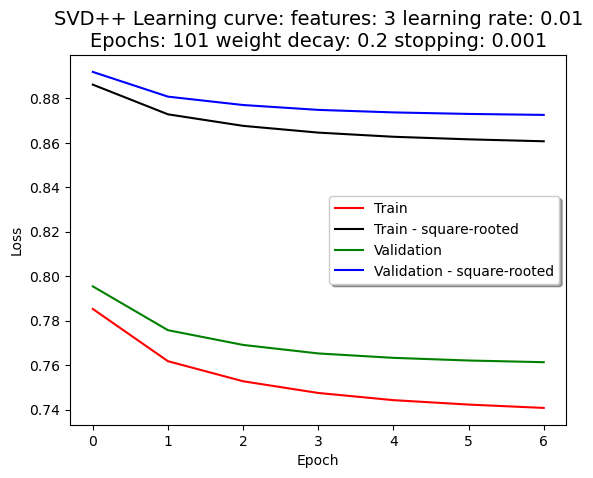

features: 3
learning rate: 0.01
Epochs: 101
weight decay: 2
stopping: 0.001



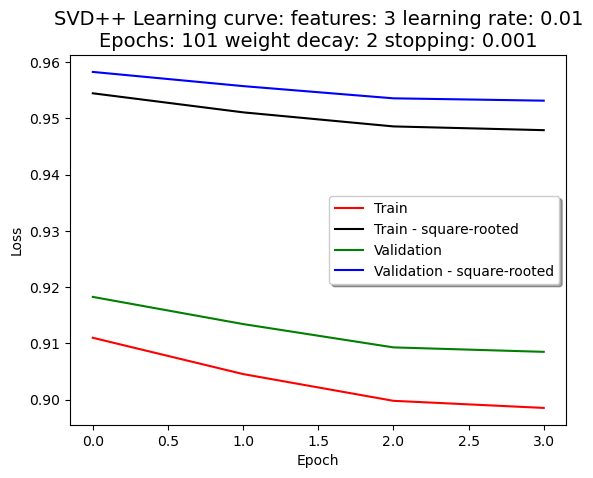

features: 3
learning rate: 0.001
Epochs: 101
weight decay: 0.02
stopping: 0.001



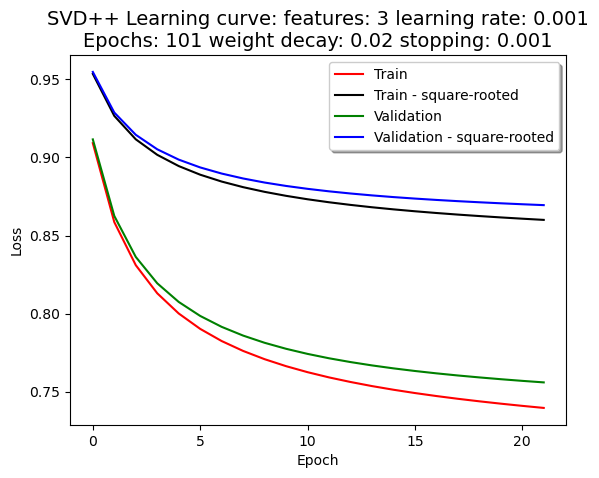

features: 3
learning rate: 0.001
Epochs: 101
weight decay: 0.2
stopping: 0.001



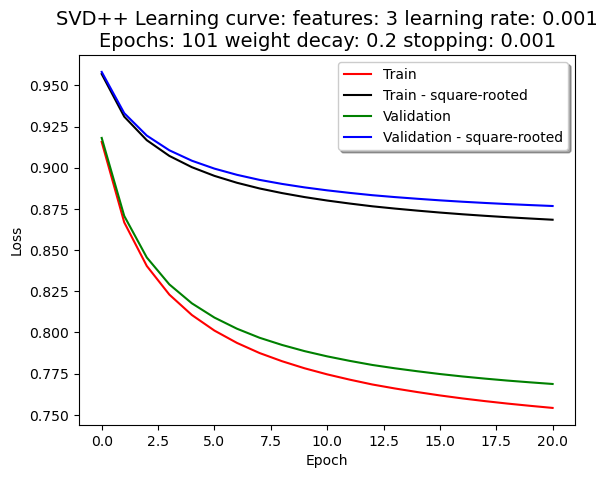

features: 3
learning rate: 0.001
Epochs: 101
weight decay: 2
stopping: 0.001



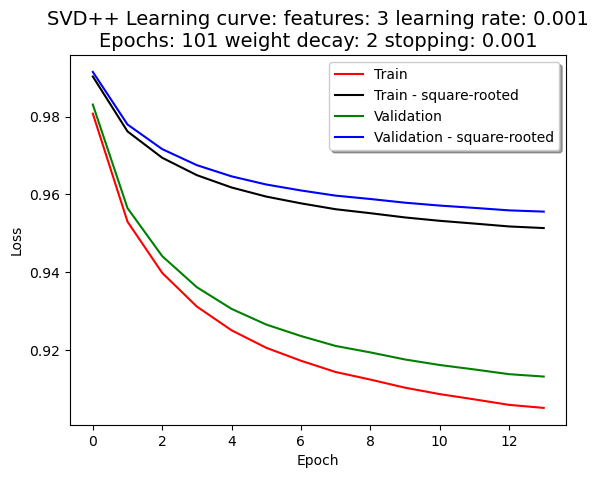

features: 3
learning rate: 0.0001
Epochs: 101
weight decay: 0.02
stopping: 0.001



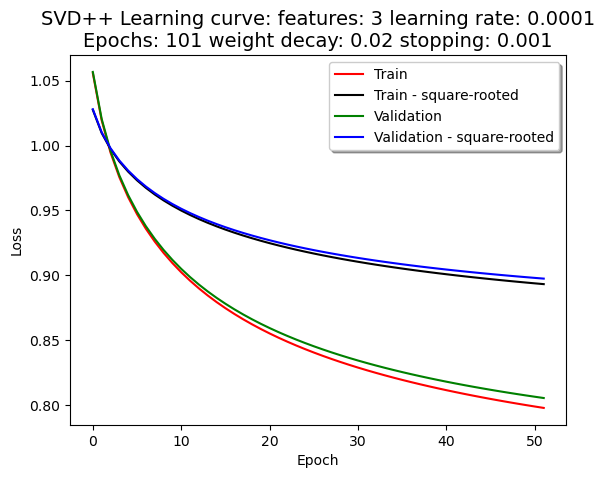

features: 3
learning rate: 0.0001
Epochs: 101
weight decay: 0.2
stopping: 0.001



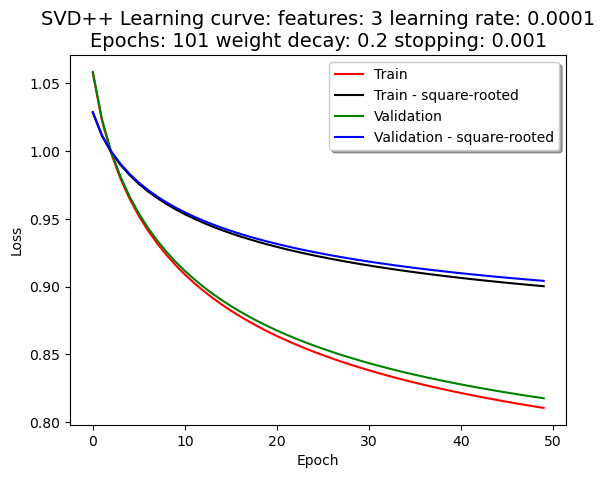

features: 3
learning rate: 0.0001
Epochs: 101
weight decay: 2
stopping: 0.001



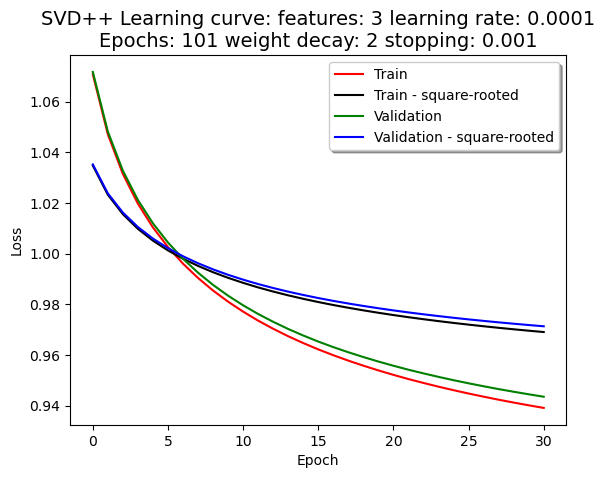

features: 30
learning rate: 0.01
Epochs: 101
weight decay: 0.02
stopping: 0.001



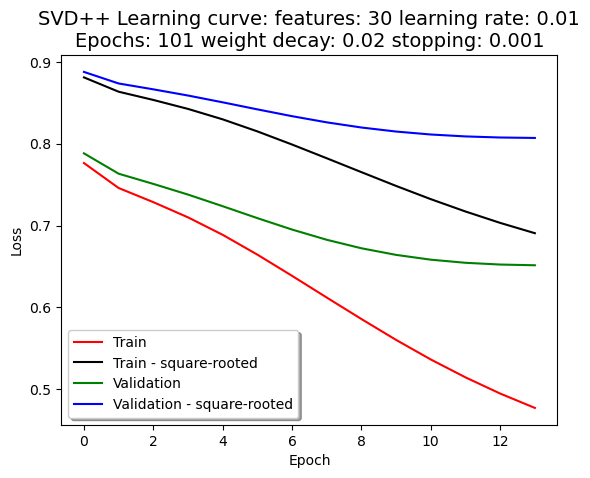

features: 30
learning rate: 0.01
Epochs: 101
weight decay: 0.2
stopping: 0.001



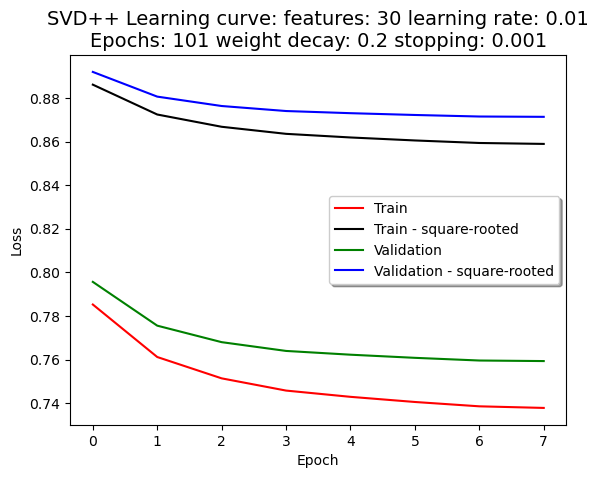

features: 30
learning rate: 0.01
Epochs: 101
weight decay: 2
stopping: 0.001



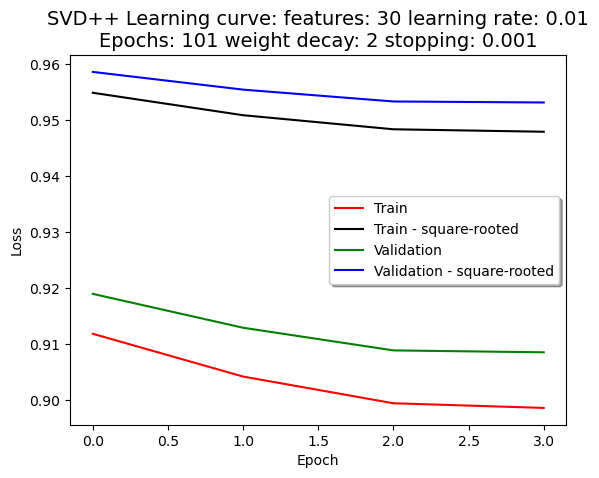

features: 30
learning rate: 0.001
Epochs: 101
weight decay: 0.02
stopping: 0.001



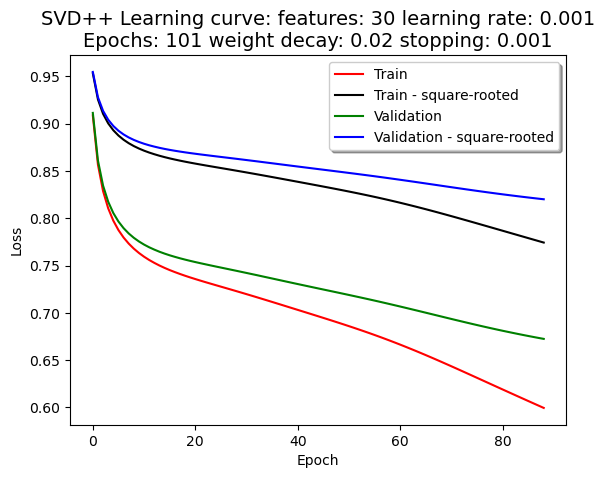

features: 30
learning rate: 0.001
Epochs: 101
weight decay: 0.2
stopping: 0.001



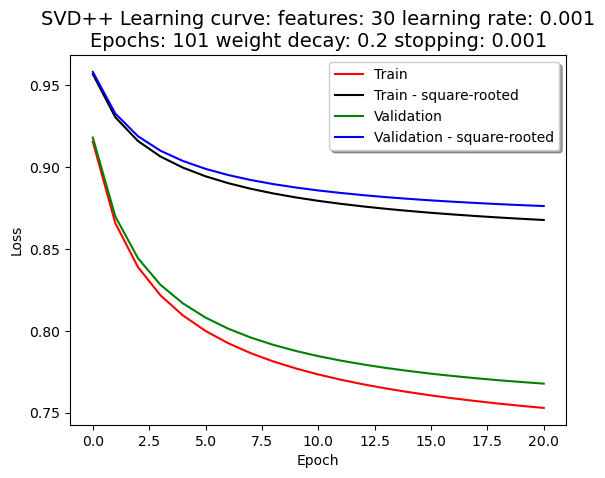

features: 30
learning rate: 0.001
Epochs: 101
weight decay: 2
stopping: 0.001



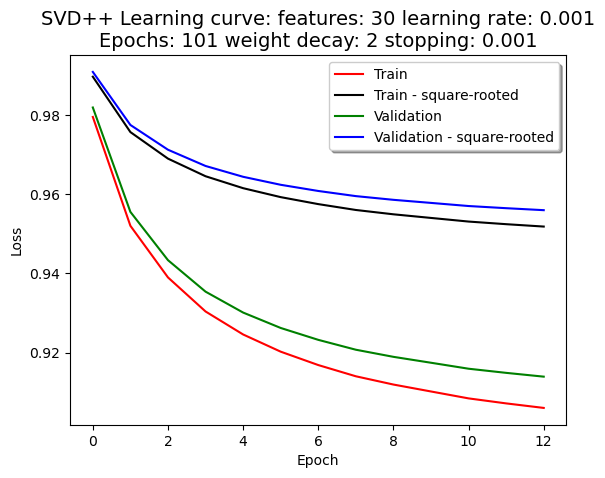

features: 30
learning rate: 0.0001
Epochs: 101
weight decay: 0.02
stopping: 0.001



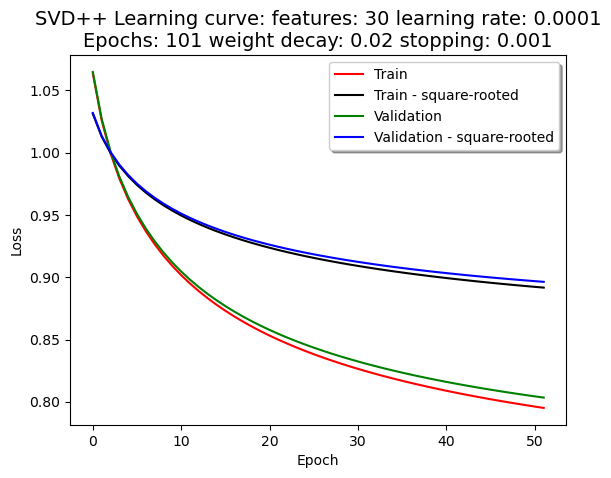

features: 30
learning rate: 0.0001
Epochs: 101
weight decay: 0.2
stopping: 0.001



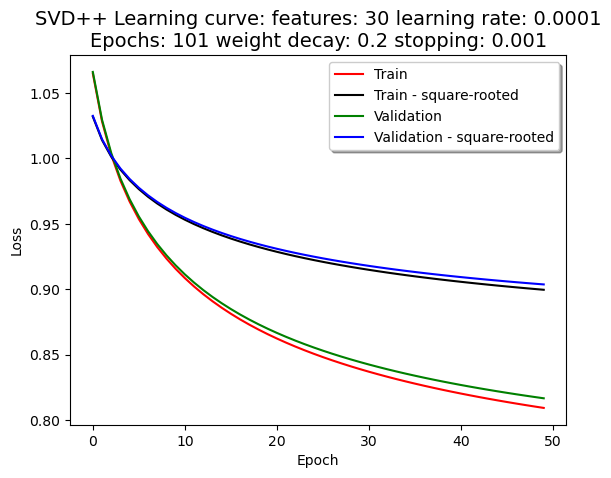

features: 30
learning rate: 0.0001
Epochs: 101
weight decay: 2
stopping: 0.001



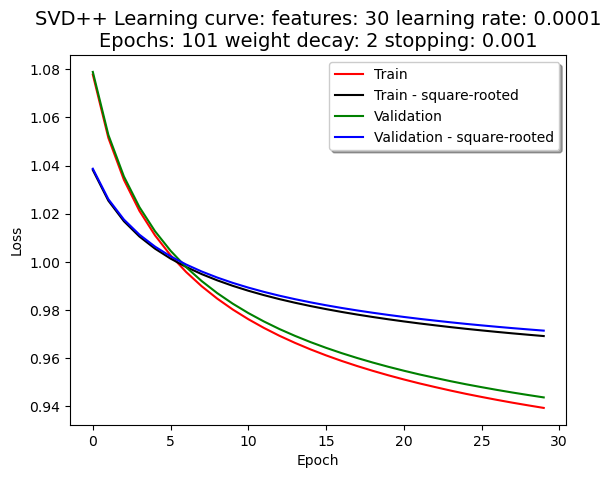

features: 150
learning rate: 0.01
Epochs: 101
weight decay: 0.02
stopping: 0.001



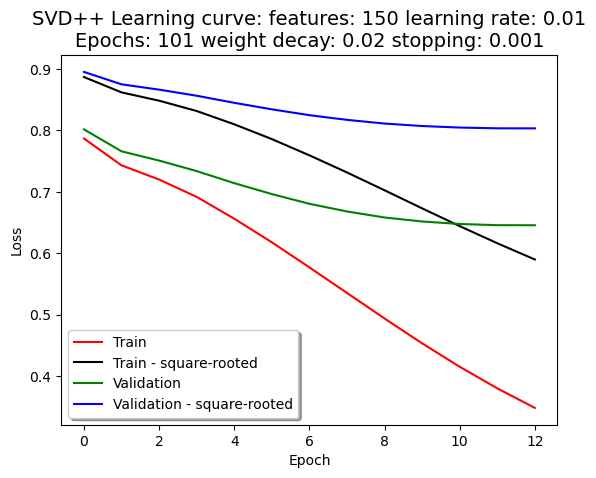

features: 150
learning rate: 0.01
Epochs: 101
weight decay: 0.2
stopping: 0.001



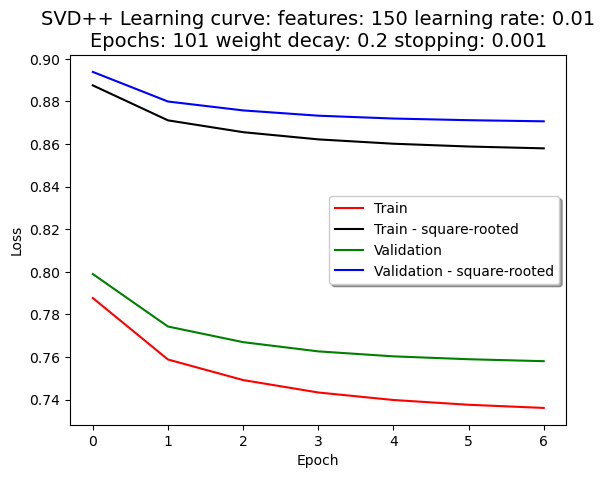

features: 150
learning rate: 0.01
Epochs: 101
weight decay: 2
stopping: 0.001



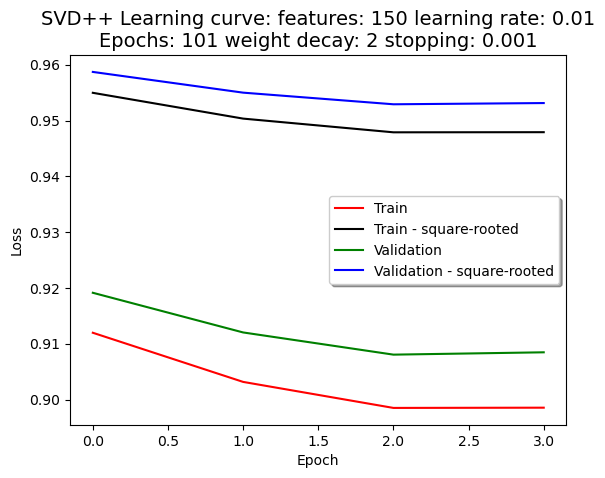

features: 150
learning rate: 0.001
Epochs: 101
weight decay: 0.02
stopping: 0.001



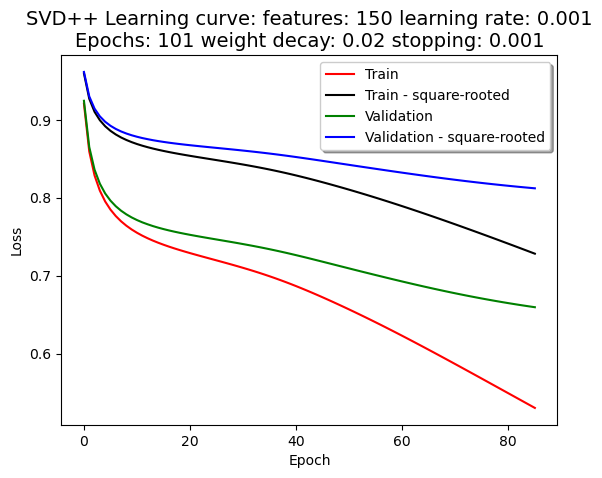

features: 150
learning rate: 0.001
Epochs: 101
weight decay: 0.2
stopping: 0.001



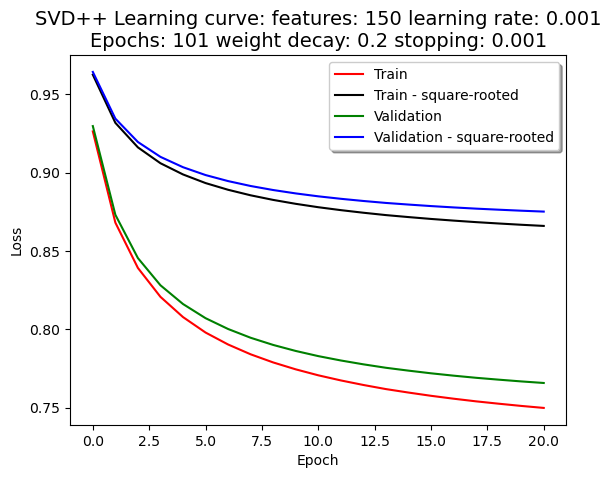

features: 150
learning rate: 0.001
Epochs: 101
weight decay: 2
stopping: 0.001



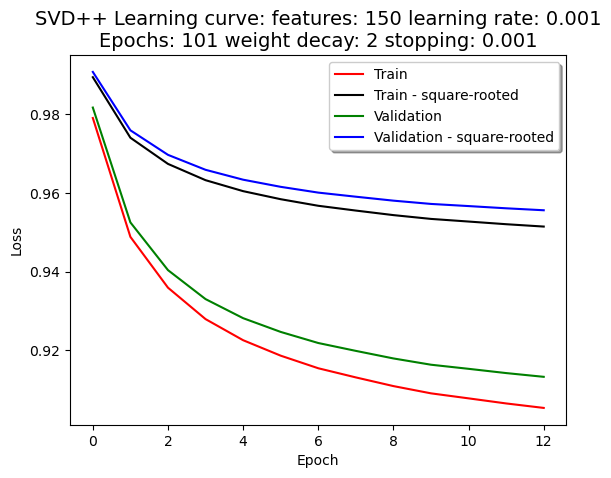

features: 150
learning rate: 0.0001
Epochs: 101
weight decay: 0.02
stopping: 0.001



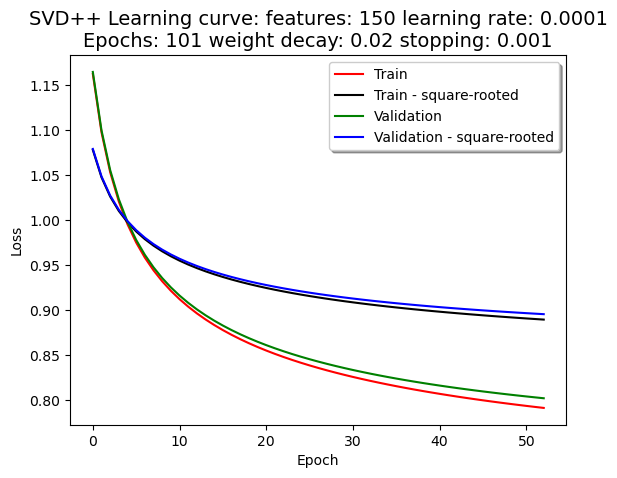

features: 150
learning rate: 0.0001
Epochs: 101
weight decay: 0.2
stopping: 0.001



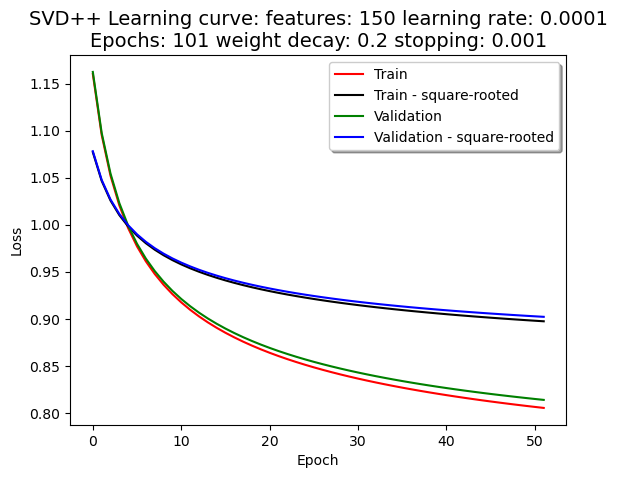

features: 150
learning rate: 0.0001
Epochs: 101
weight decay: 2
stopping: 0.001



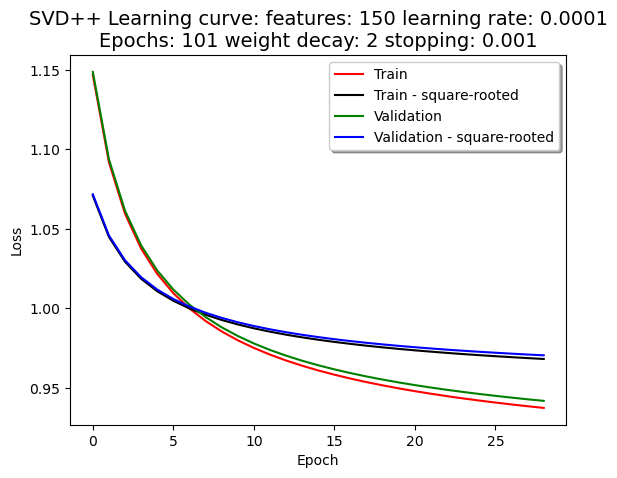

features: 300
learning rate: 0.01
Epochs: 101
weight decay: 0.02
stopping: 0.001



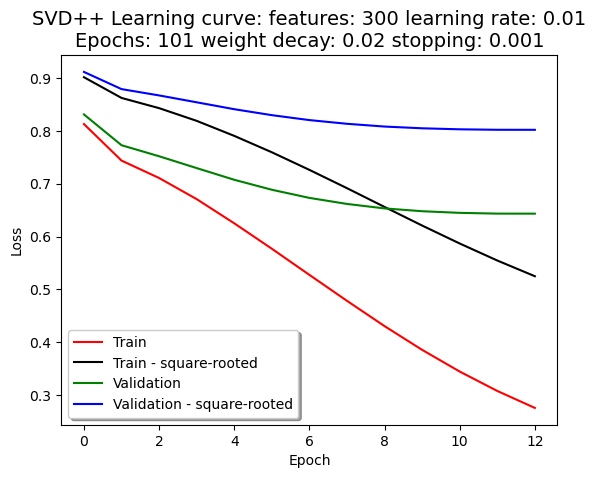

features: 300
learning rate: 0.01
Epochs: 101
weight decay: 0.2
stopping: 0.001



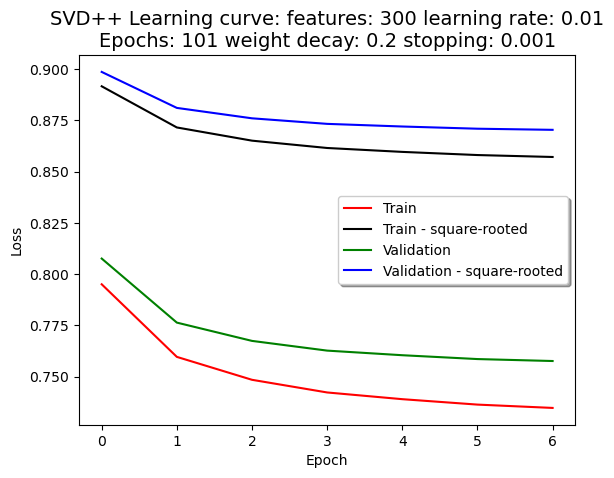

features: 300
learning rate: 0.01
Epochs: 101
weight decay: 2
stopping: 0.001



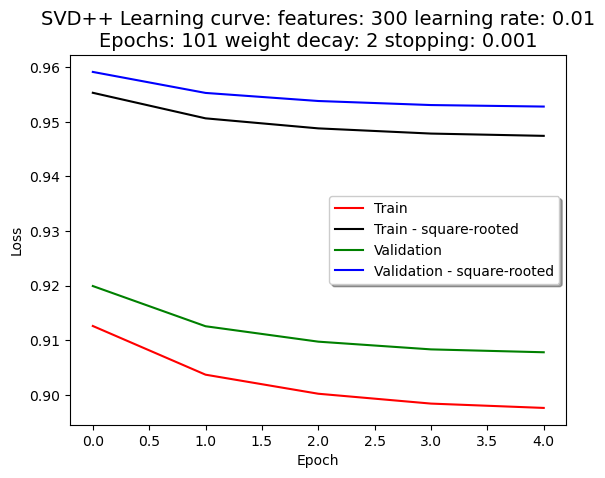

features: 300
learning rate: 0.001
Epochs: 101
weight decay: 0.02
stopping: 0.001



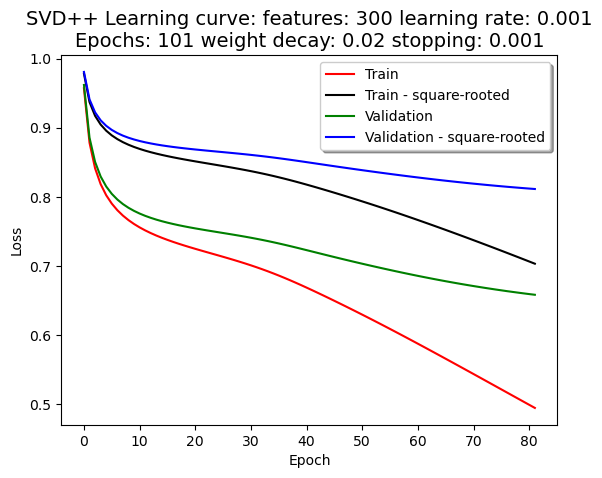

features: 300
learning rate: 0.001
Epochs: 101
weight decay: 0.2
stopping: 0.001



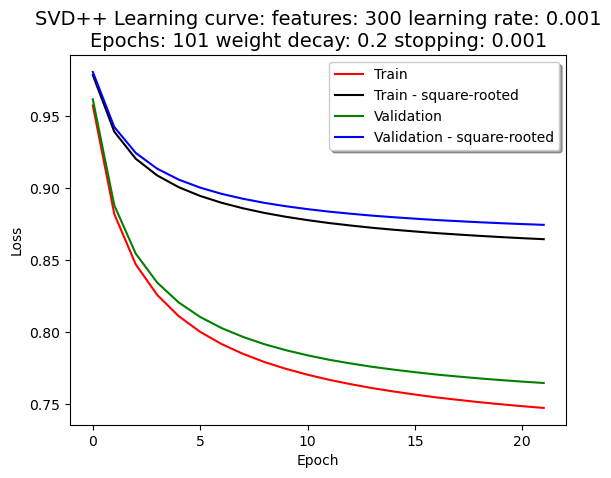

features: 300
learning rate: 0.001
Epochs: 101
weight decay: 2
stopping: 0.001



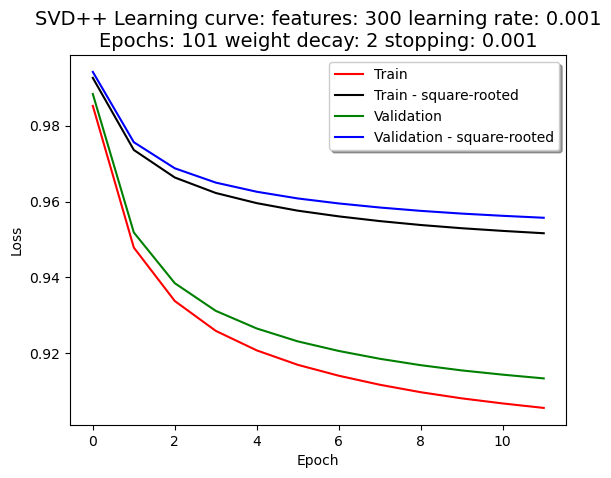

features: 300
learning rate: 0.0001
Epochs: 101
weight decay: 0.02
stopping: 0.001



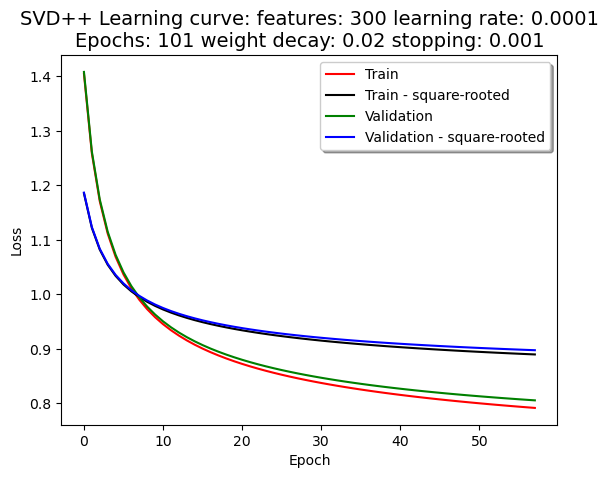

features: 300
learning rate: 0.0001
Epochs: 101
weight decay: 0.2
stopping: 0.001



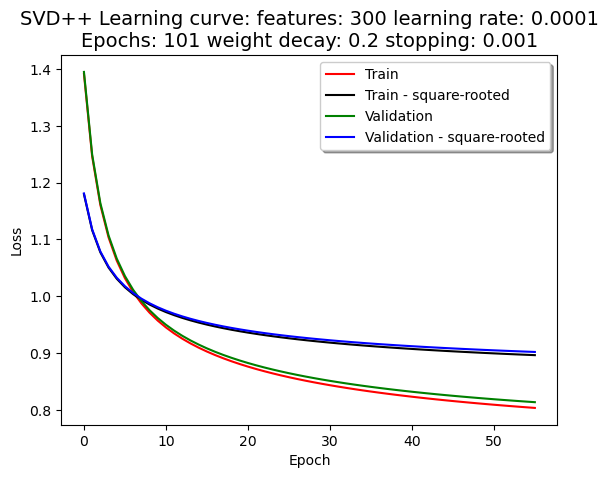

features: 300
learning rate: 0.0001
Epochs: 101
weight decay: 2
stopping: 0.001



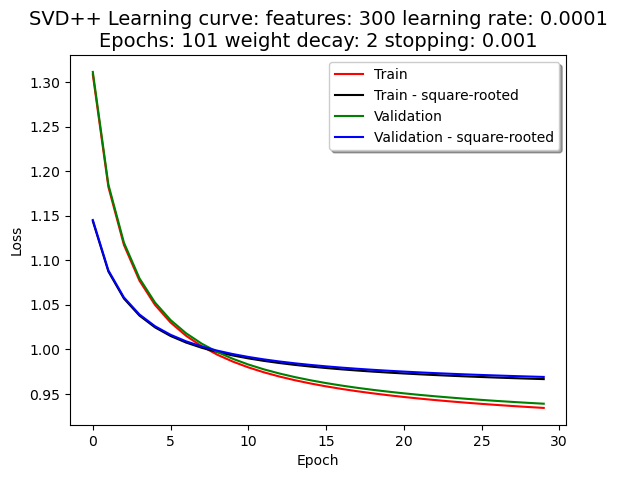

features: 3
learning rate: 0.01
Epochs: 201
weight decay: 0.02
stopping: 0.001



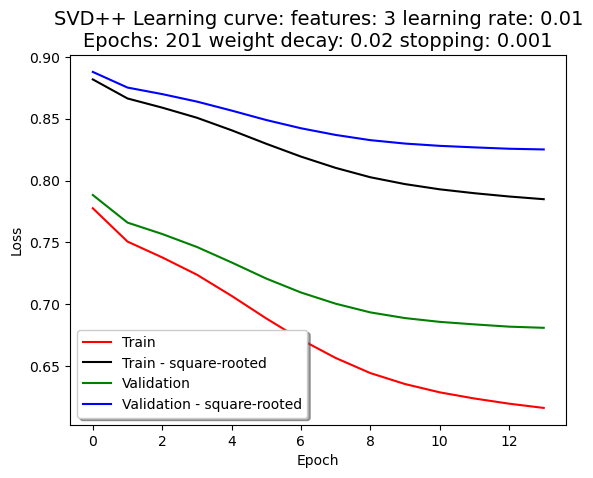

features: 3
learning rate: 0.01
Epochs: 201
weight decay: 0.2
stopping: 0.001



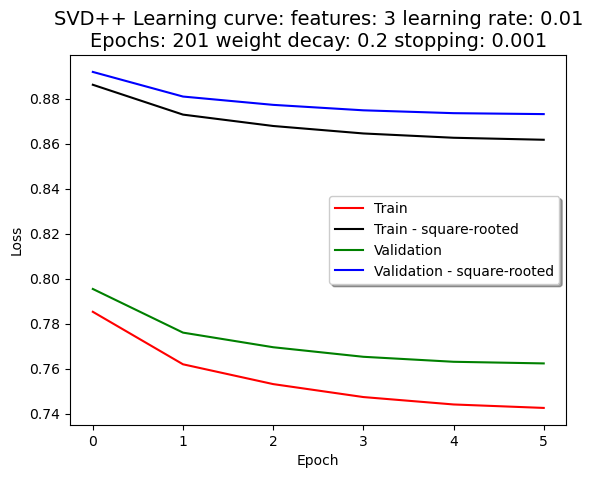

features: 3
learning rate: 0.01
Epochs: 201
weight decay: 2
stopping: 0.001



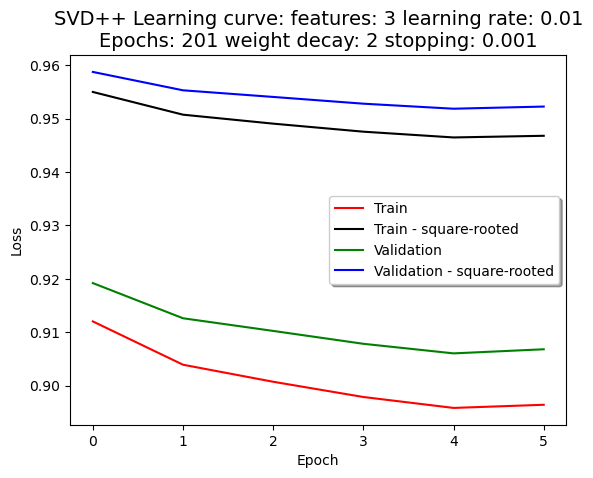

features: 3
learning rate: 0.001
Epochs: 201
weight decay: 0.02
stopping: 0.001



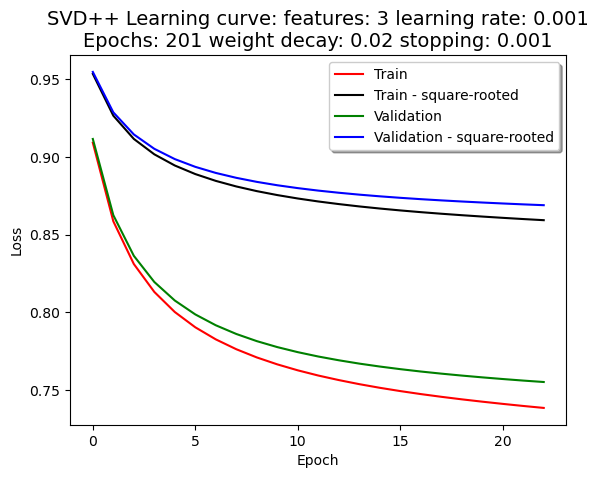

features: 3
learning rate: 0.001
Epochs: 201
weight decay: 0.2
stopping: 0.001



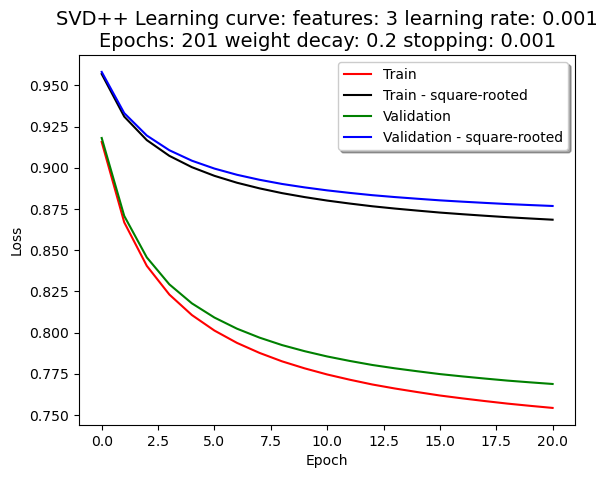

features: 3
learning rate: 0.001
Epochs: 201
weight decay: 2
stopping: 0.001



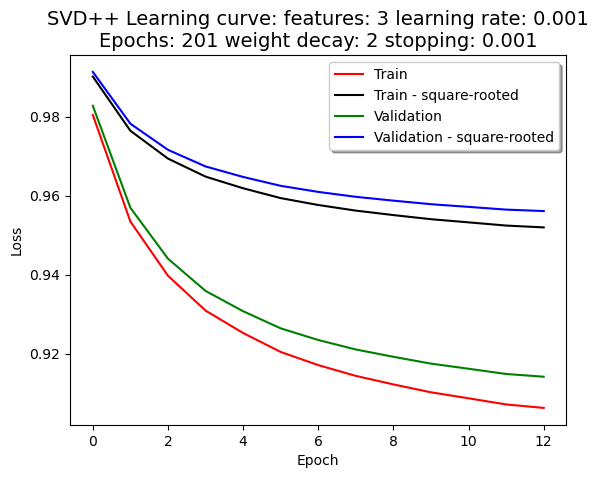

features: 3
learning rate: 0.0001
Epochs: 201
weight decay: 0.02
stopping: 0.001



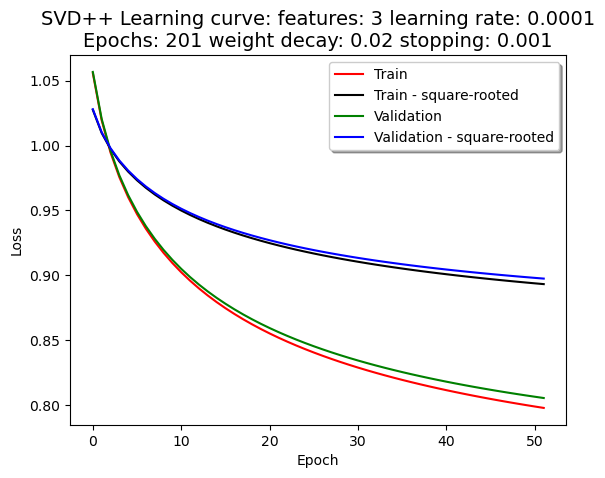

features: 3
learning rate: 0.0001
Epochs: 201
weight decay: 0.2
stopping: 0.001



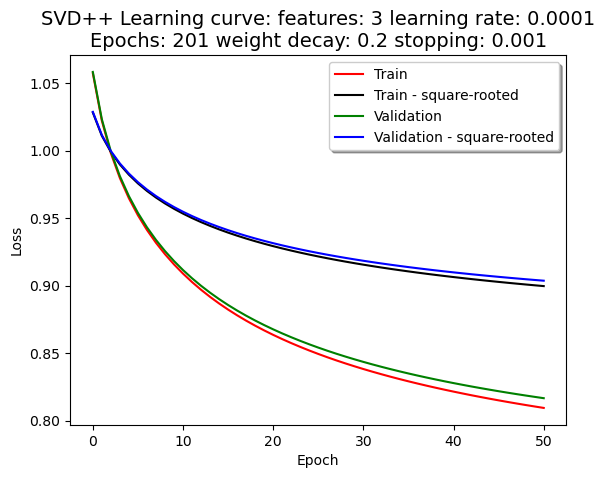

features: 3
learning rate: 0.0001
Epochs: 201
weight decay: 2
stopping: 0.001



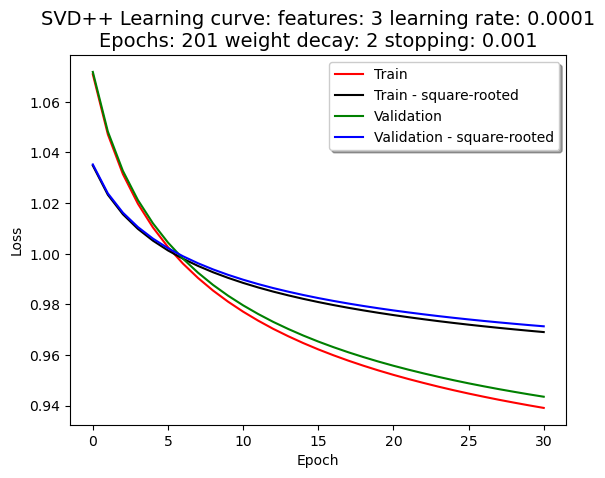

features: 30
learning rate: 0.01
Epochs: 201
weight decay: 0.02
stopping: 0.001



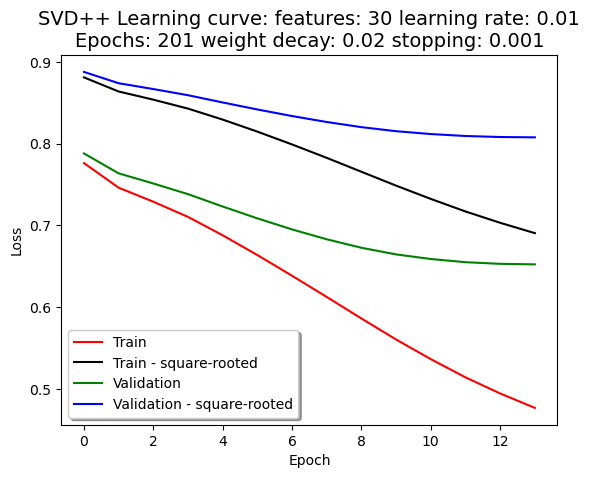

features: 30
learning rate: 0.01
Epochs: 201
weight decay: 0.2
stopping: 0.001



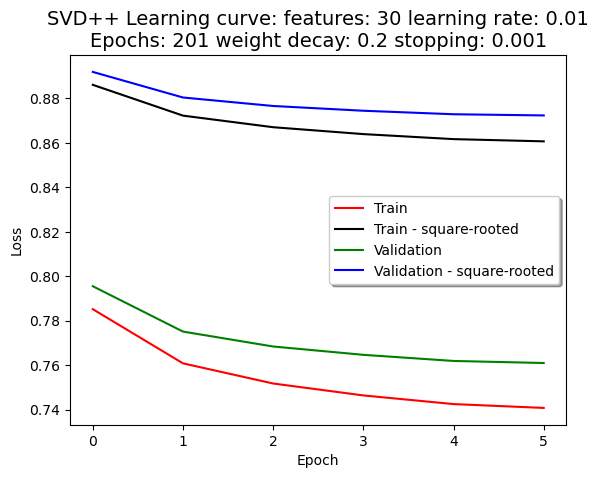

features: 30
learning rate: 0.01
Epochs: 201
weight decay: 2
stopping: 0.001



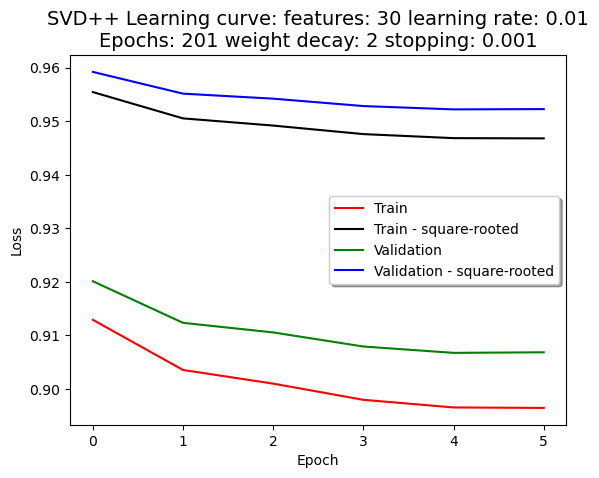

features: 30
learning rate: 0.001
Epochs: 201
weight decay: 0.02
stopping: 0.001



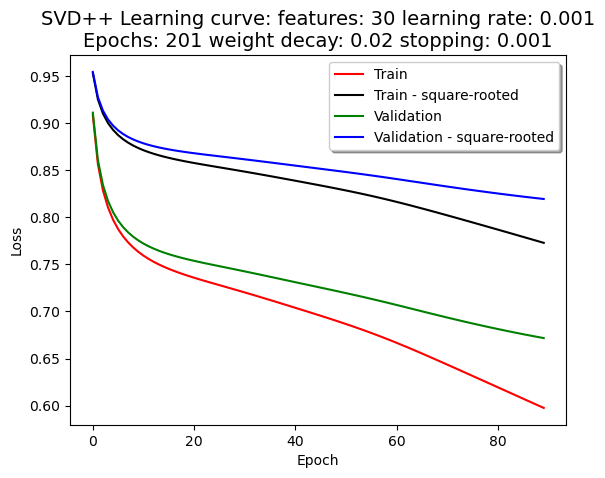

features: 30
learning rate: 0.001
Epochs: 201
weight decay: 0.2
stopping: 0.001



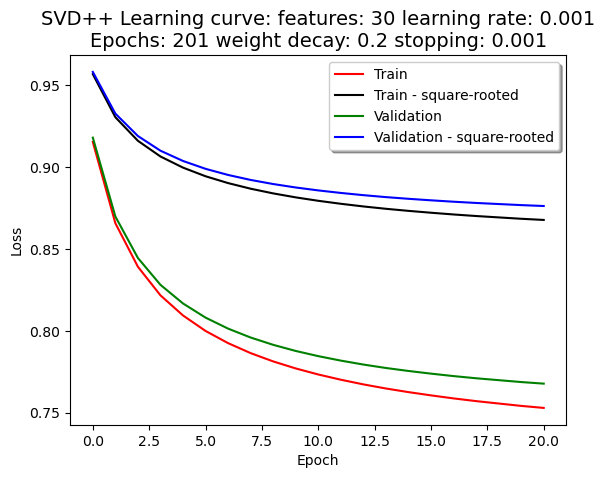

features: 30
learning rate: 0.001
Epochs: 201
weight decay: 2
stopping: 0.001



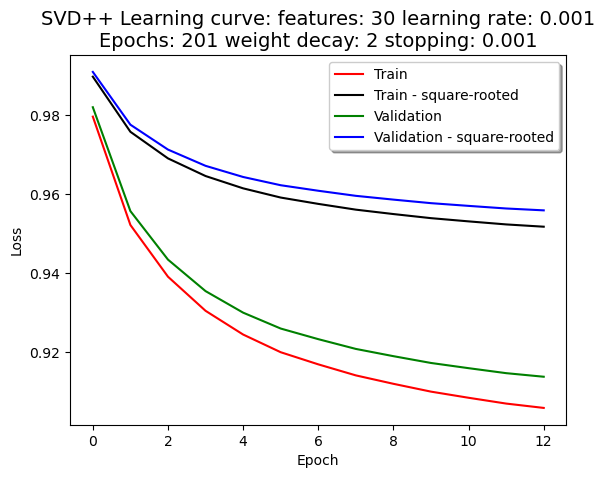

features: 30
learning rate: 0.0001
Epochs: 201
weight decay: 0.02
stopping: 0.001



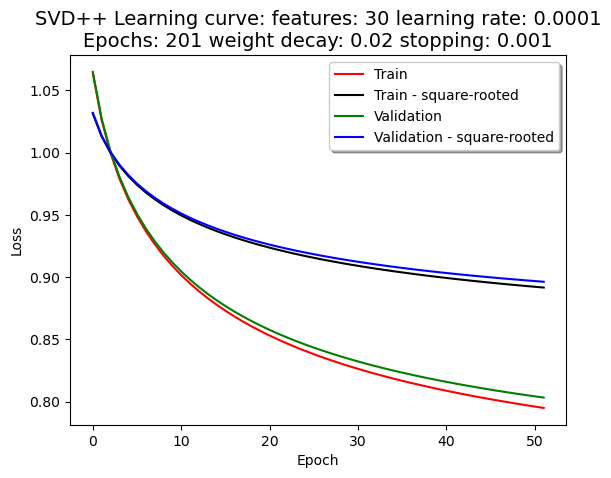

features: 30
learning rate: 0.0001
Epochs: 201
weight decay: 0.2
stopping: 0.001



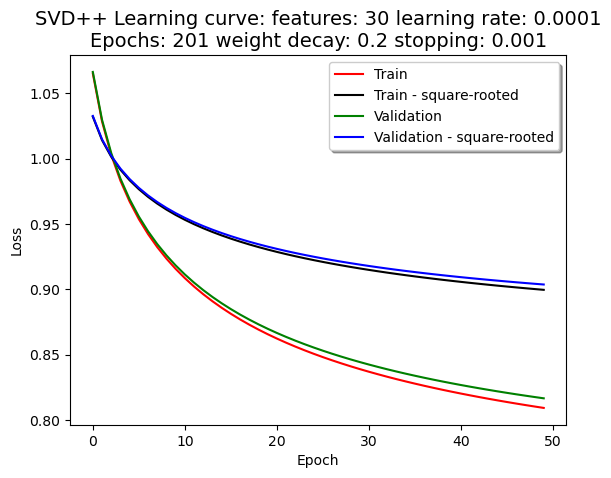

features: 30
learning rate: 0.0001
Epochs: 201
weight decay: 2
stopping: 0.001



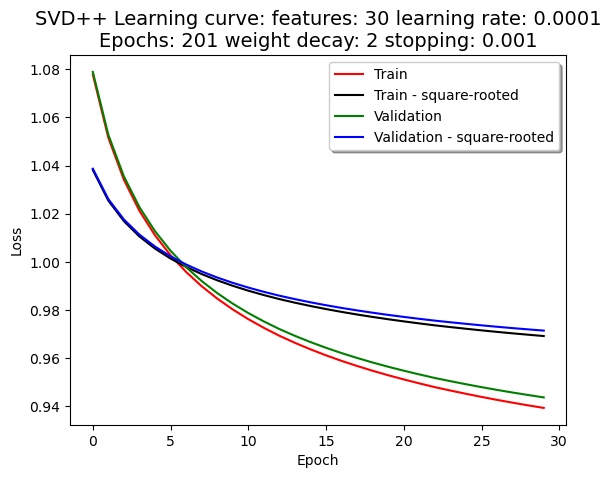

features: 150
learning rate: 0.01
Epochs: 201
weight decay: 0.02
stopping: 0.001



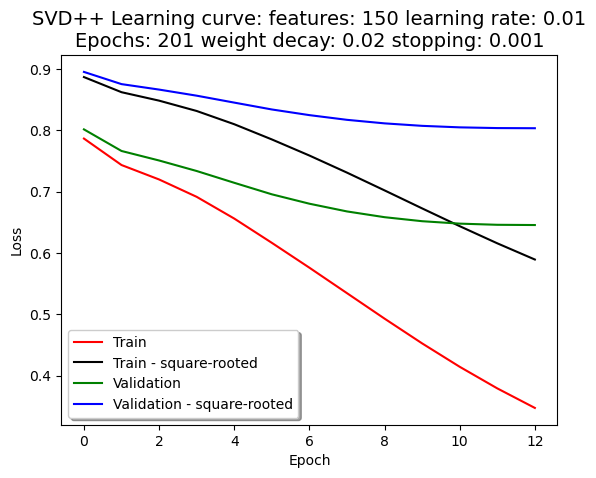

features: 150
learning rate: 0.01
Epochs: 201
weight decay: 0.2
stopping: 0.001



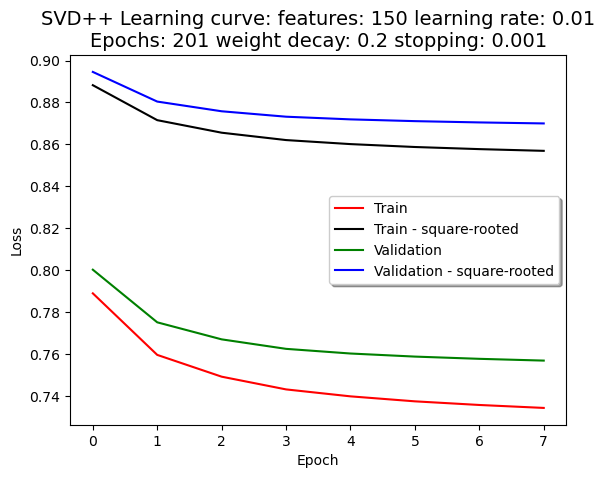

features: 150
learning rate: 0.01
Epochs: 201
weight decay: 2
stopping: 0.001



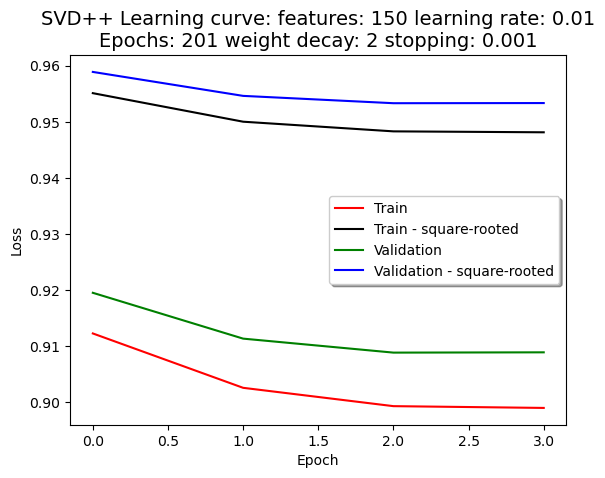

features: 150
learning rate: 0.001
Epochs: 201
weight decay: 0.02
stopping: 0.001



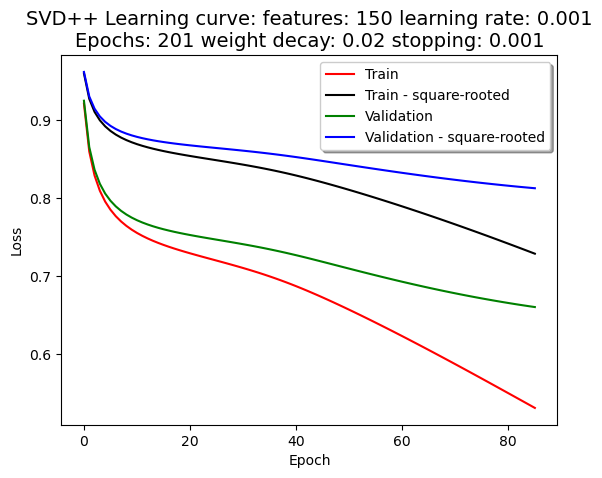

features: 150
learning rate: 0.001
Epochs: 201
weight decay: 0.2
stopping: 0.001



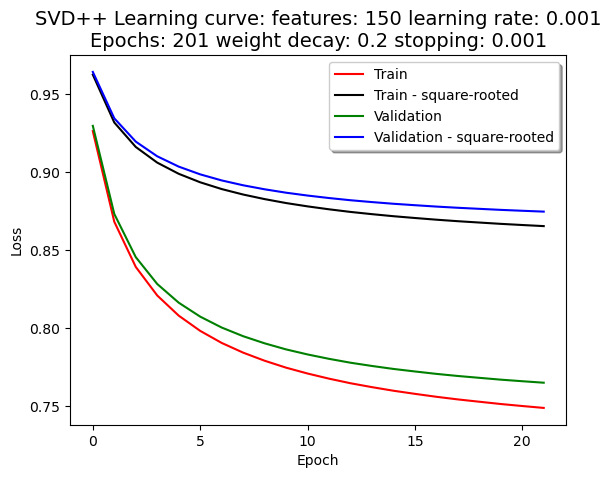

features: 150
learning rate: 0.001
Epochs: 201
weight decay: 2
stopping: 0.001



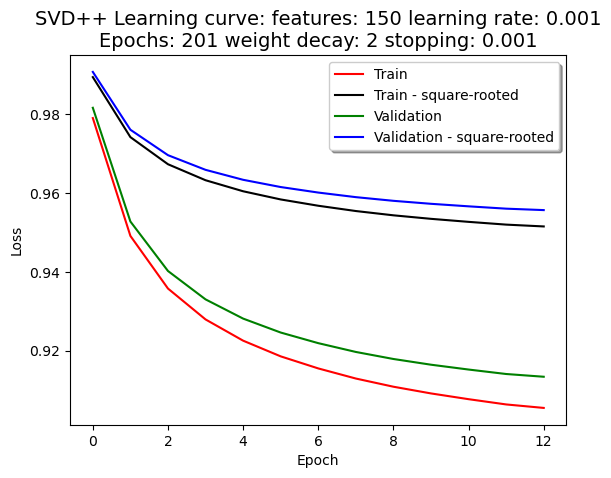

features: 150
learning rate: 0.0001
Epochs: 201
weight decay: 0.02
stopping: 0.001



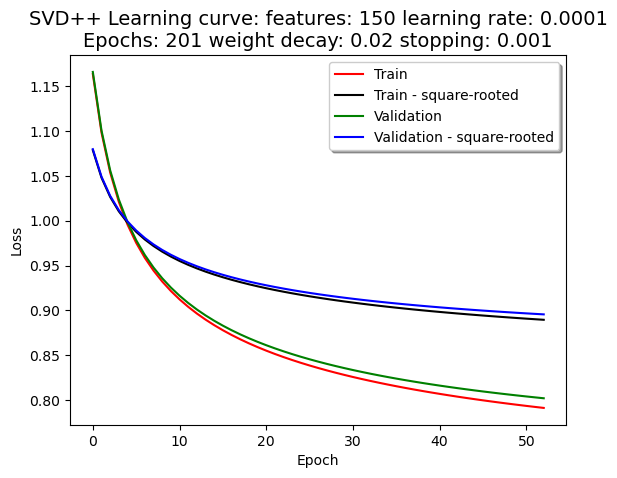

features: 150
learning rate: 0.0001
Epochs: 201
weight decay: 0.2
stopping: 0.001



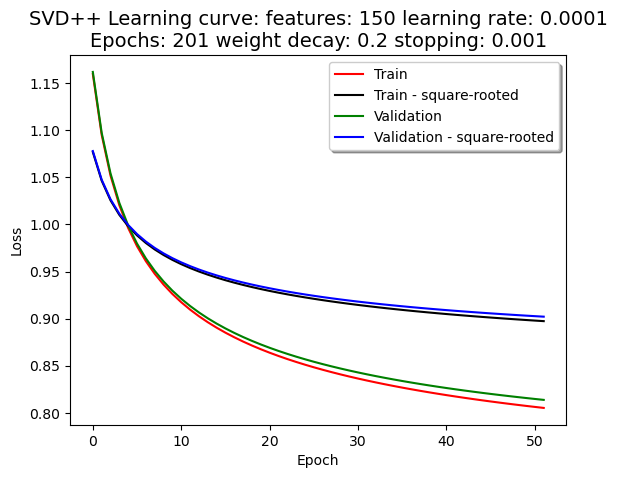

features: 150
learning rate: 0.0001
Epochs: 201
weight decay: 2
stopping: 0.001



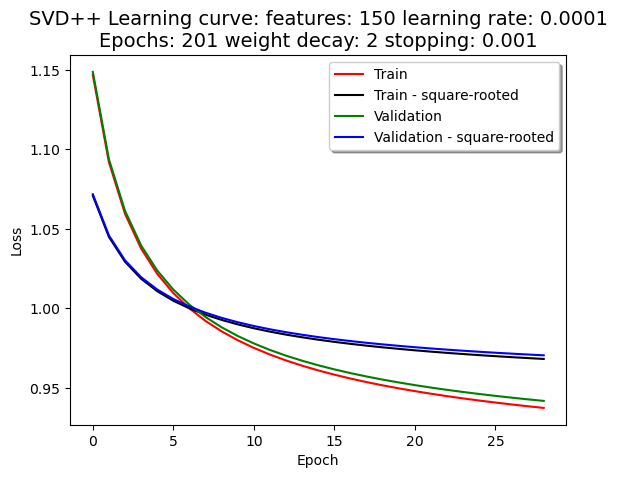

features: 300
learning rate: 0.01
Epochs: 201
weight decay: 0.02
stopping: 0.001



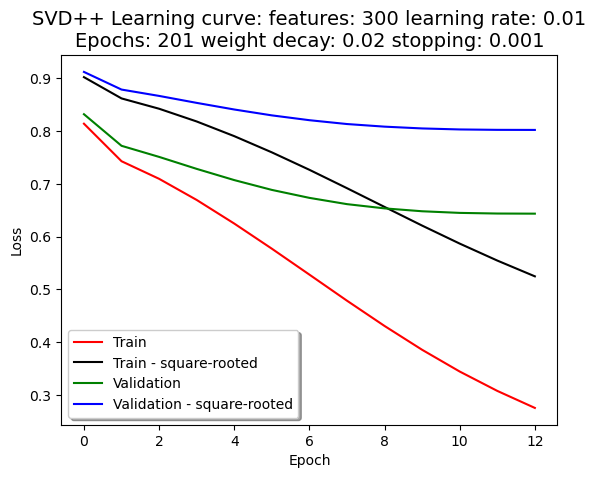

features: 300
learning rate: 0.01
Epochs: 201
weight decay: 0.2
stopping: 0.001



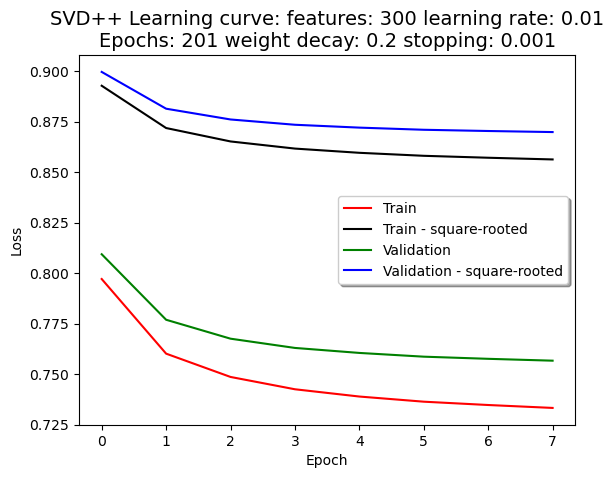

features: 300
learning rate: 0.01
Epochs: 201
weight decay: 2
stopping: 0.001



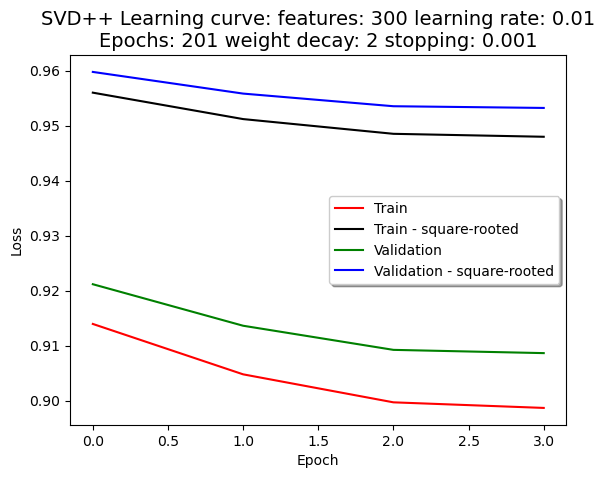

features: 300
learning rate: 0.001
Epochs: 201
weight decay: 0.02
stopping: 0.001



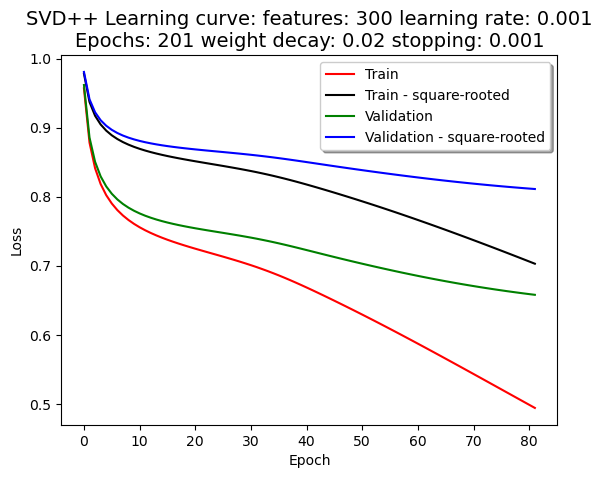

features: 300
learning rate: 0.001
Epochs: 201
weight decay: 0.2
stopping: 0.001



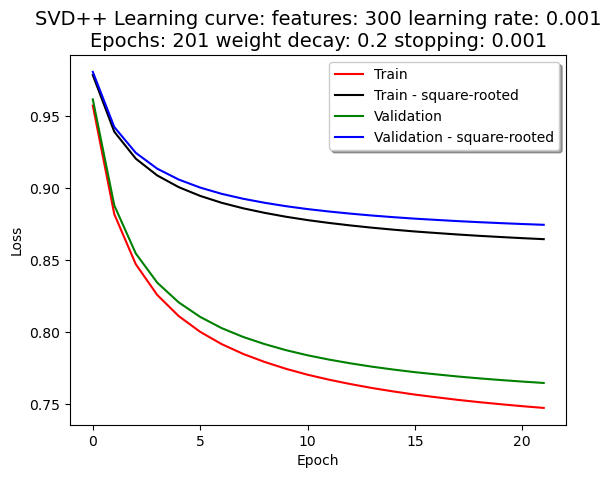

features: 300
learning rate: 0.001
Epochs: 201
weight decay: 2
stopping: 0.001



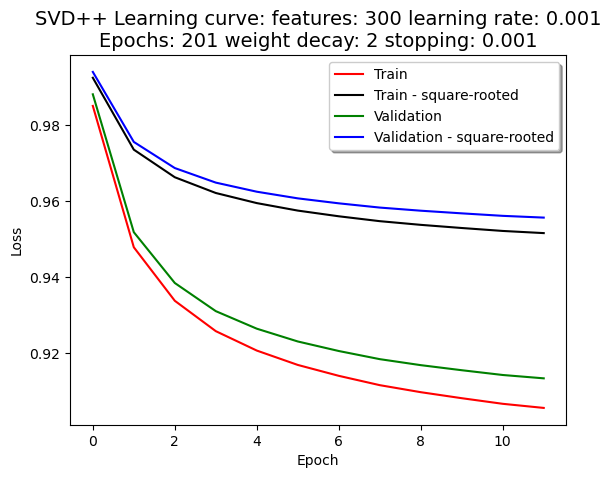

features: 300
learning rate: 0.0001
Epochs: 201
weight decay: 0.02
stopping: 0.001



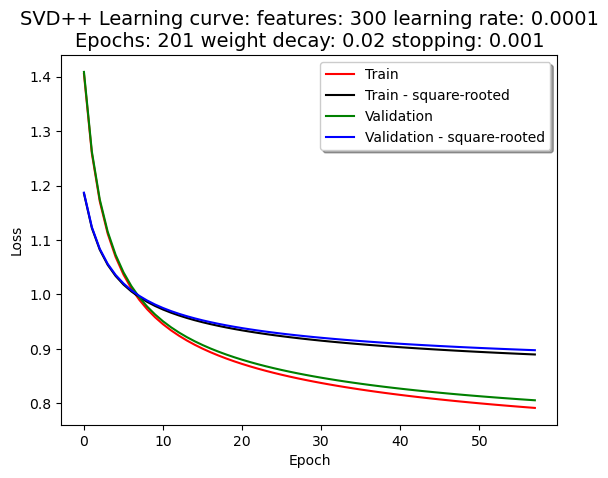

features: 300
learning rate: 0.0001
Epochs: 201
weight decay: 0.2
stopping: 0.001



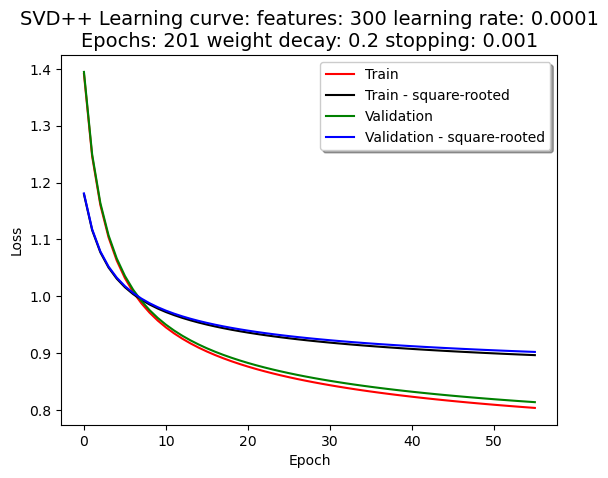

features: 300
learning rate: 0.0001
Epochs: 201
weight decay: 2
stopping: 0.001



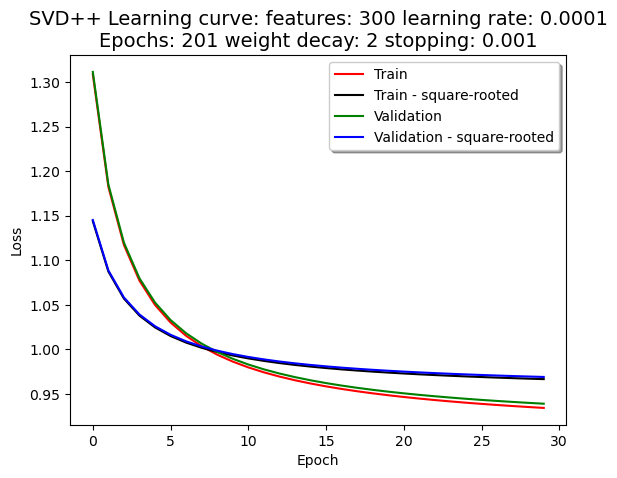

features: 3
learning rate: 0.01
Epochs: 301
weight decay: 0.02
stopping: 0.001



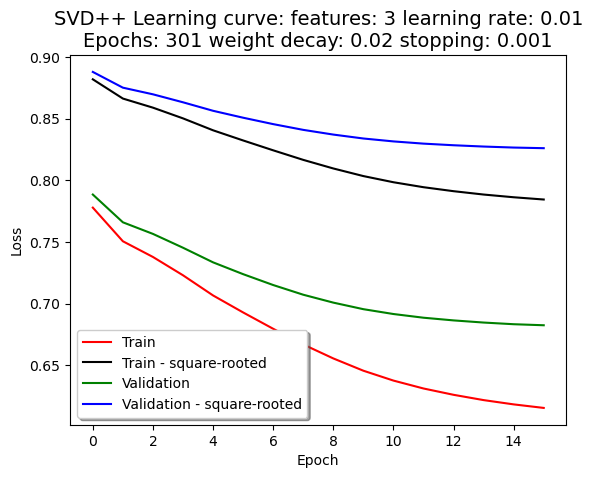

features: 3
learning rate: 0.01
Epochs: 301
weight decay: 0.2
stopping: 0.001



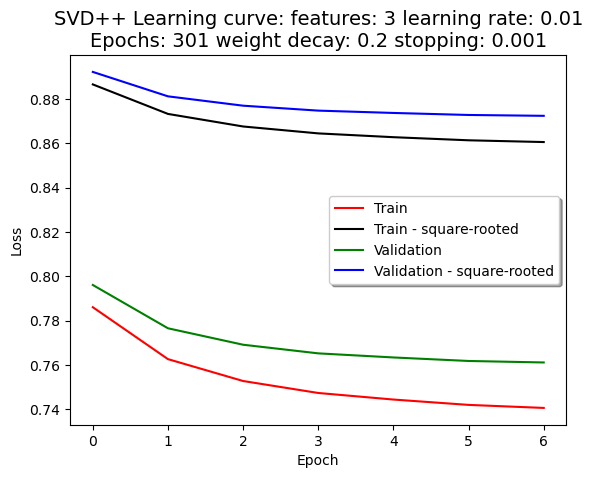

features: 3
learning rate: 0.01
Epochs: 301
weight decay: 2
stopping: 0.001



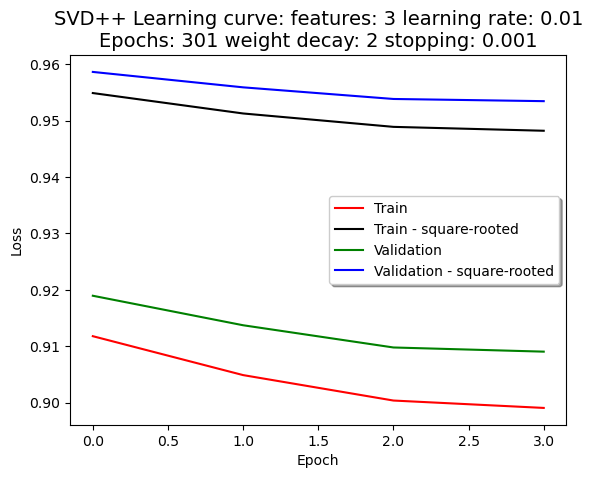

features: 3
learning rate: 0.001
Epochs: 301
weight decay: 0.02
stopping: 0.001



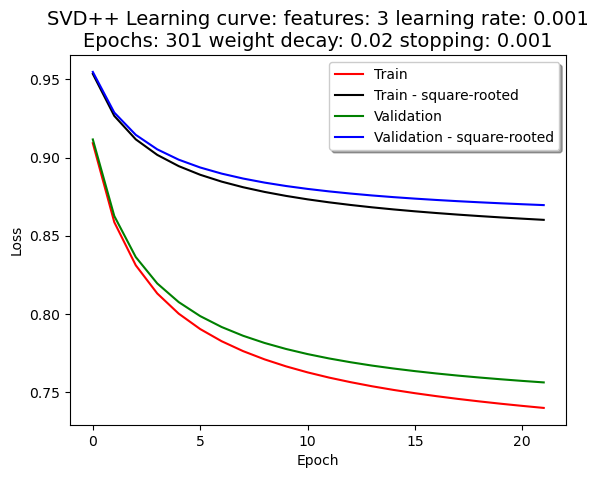

features: 3
learning rate: 0.001
Epochs: 301
weight decay: 0.2
stopping: 0.001



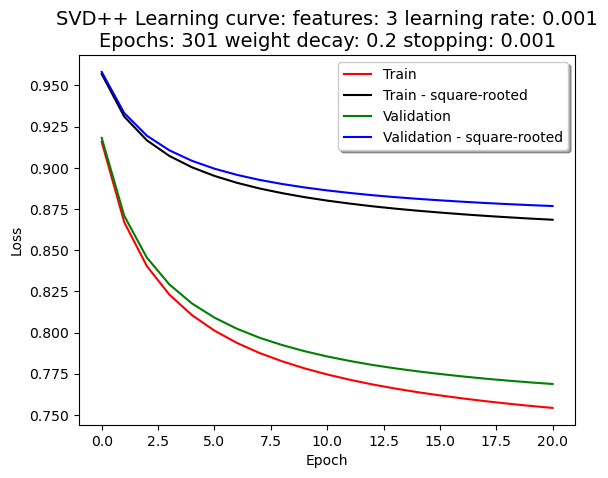

features: 3
learning rate: 0.001
Epochs: 301
weight decay: 2
stopping: 0.001



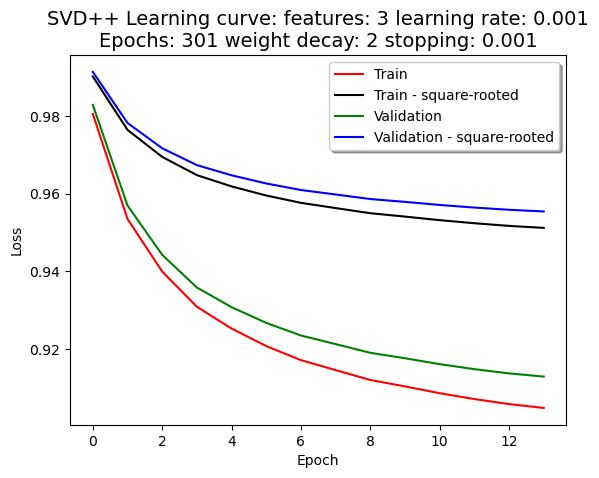

features: 3
learning rate: 0.0001
Epochs: 301
weight decay: 0.02
stopping: 0.001



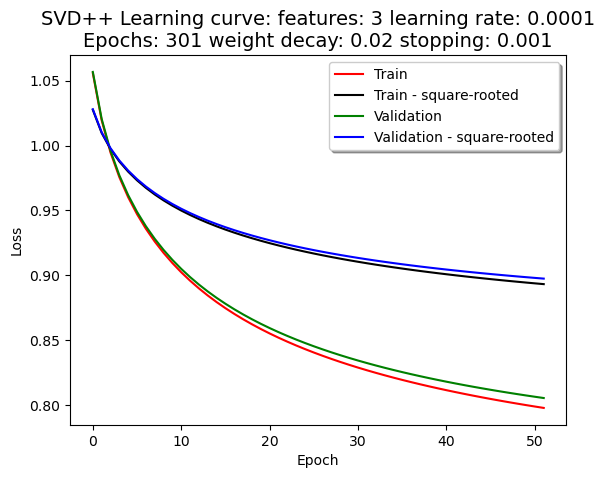

features: 3
learning rate: 0.0001
Epochs: 301
weight decay: 0.2
stopping: 0.001



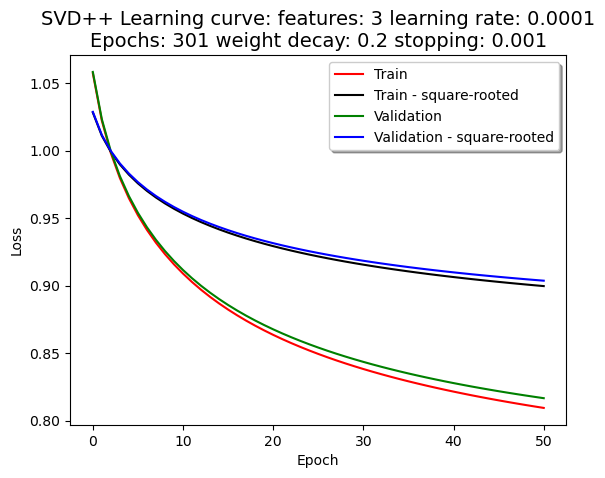

features: 3
learning rate: 0.0001
Epochs: 301
weight decay: 2
stopping: 0.001



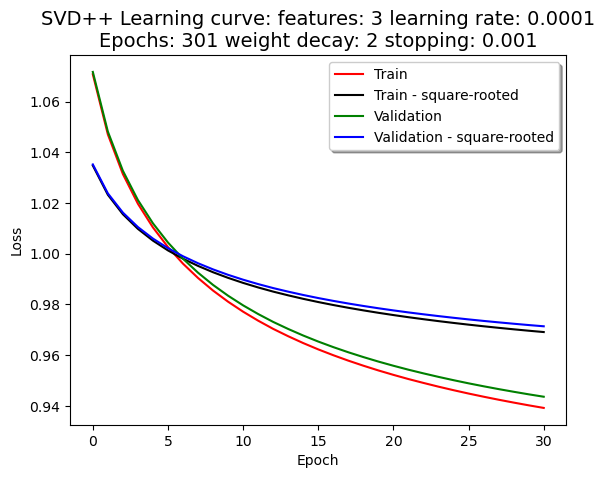

features: 30
learning rate: 0.01
Epochs: 301
weight decay: 0.02
stopping: 0.001



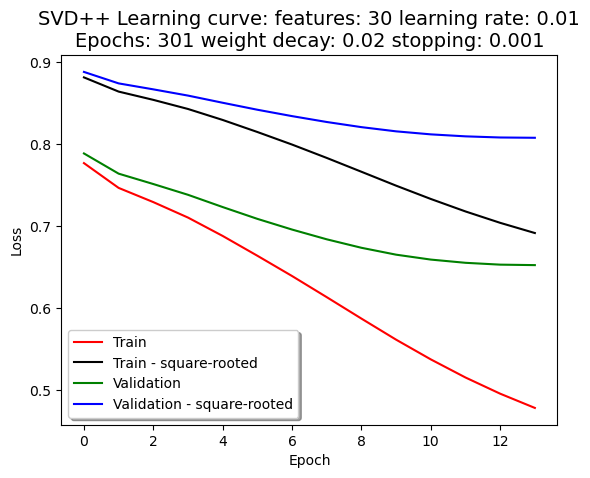

features: 30
learning rate: 0.01
Epochs: 301
weight decay: 0.2
stopping: 0.001



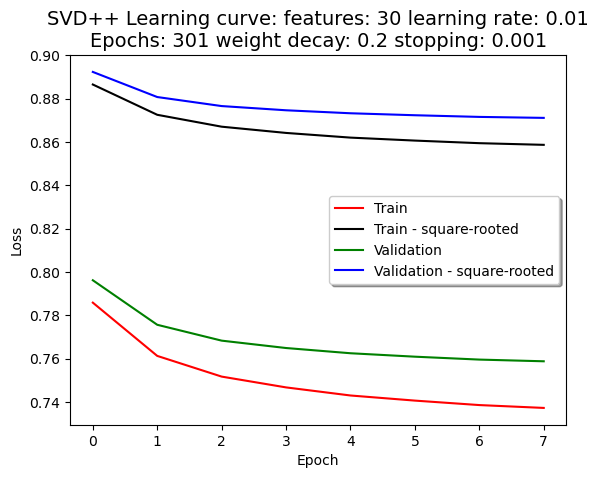

features: 30
learning rate: 0.01
Epochs: 301
weight decay: 2
stopping: 0.001



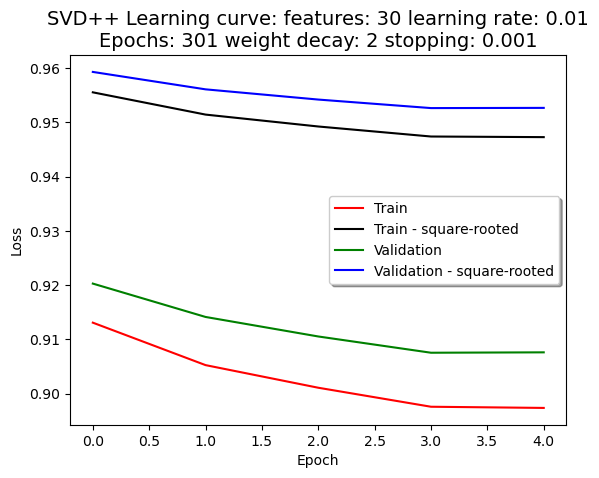

features: 30
learning rate: 0.001
Epochs: 301
weight decay: 0.02
stopping: 0.001



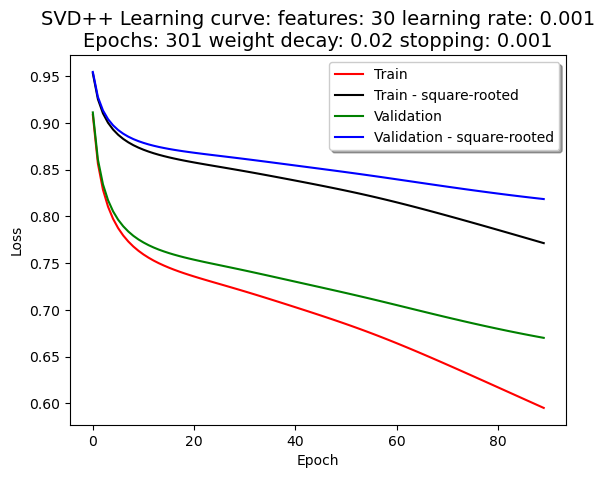

features: 30
learning rate: 0.001
Epochs: 301
weight decay: 0.2
stopping: 0.001



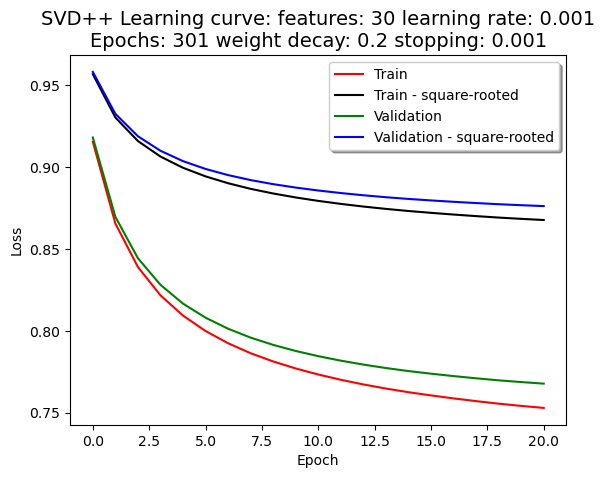

features: 30
learning rate: 0.001
Epochs: 301
weight decay: 2
stopping: 0.001



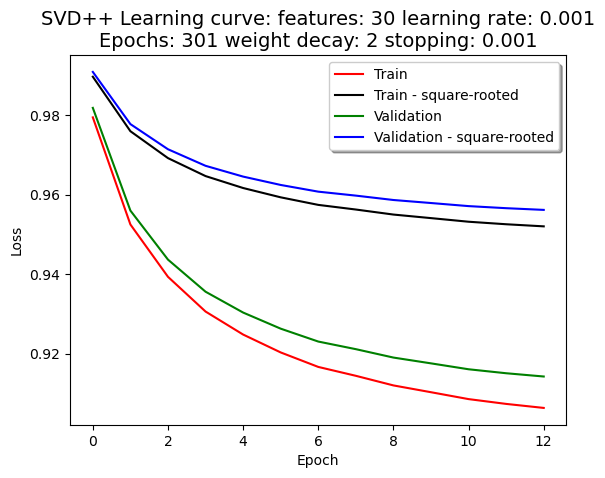

features: 30
learning rate: 0.0001
Epochs: 301
weight decay: 0.02
stopping: 0.001



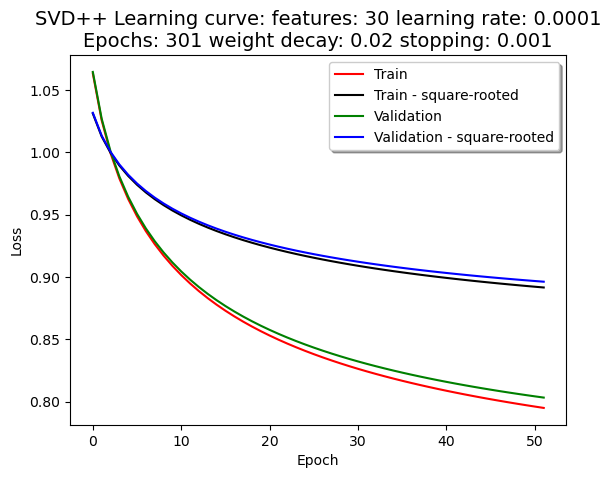

features: 30
learning rate: 0.0001
Epochs: 301
weight decay: 0.2
stopping: 0.001



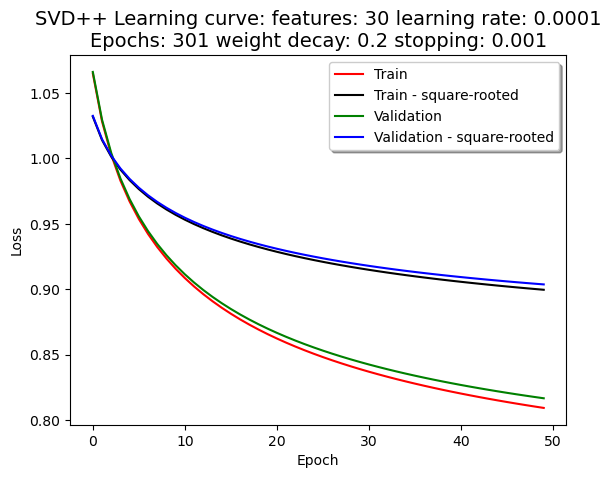

features: 30
learning rate: 0.0001
Epochs: 301
weight decay: 2
stopping: 0.001



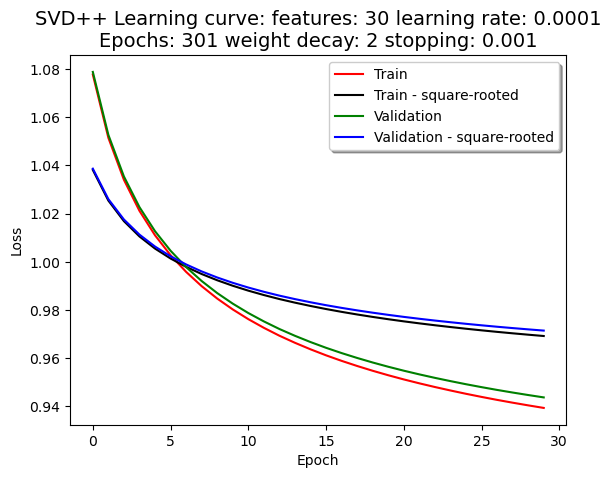

features: 150
learning rate: 0.01
Epochs: 301
weight decay: 0.02
stopping: 0.001



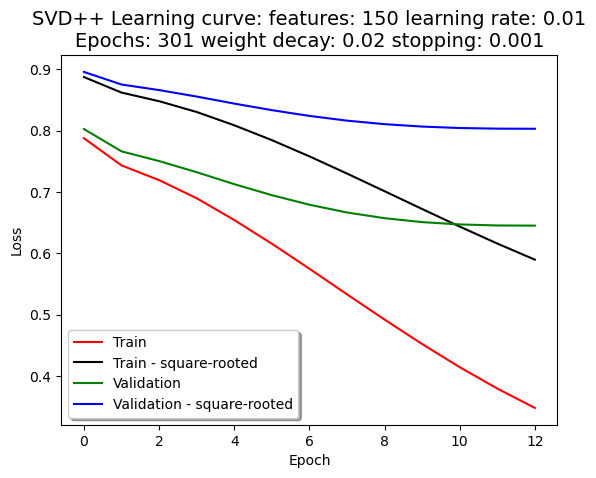

features: 150
learning rate: 0.01
Epochs: 301
weight decay: 0.2
stopping: 0.001



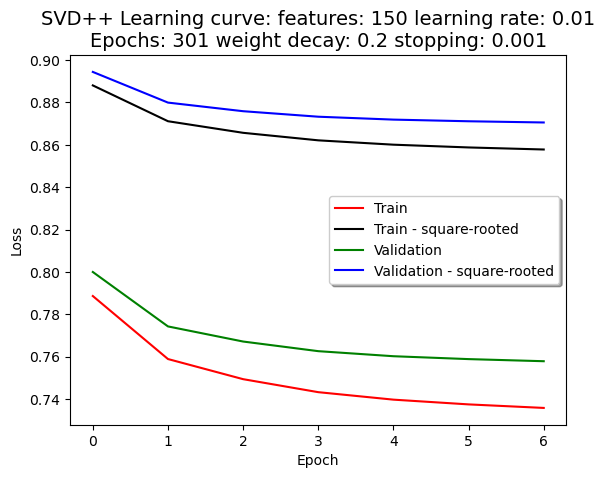

features: 150
learning rate: 0.01
Epochs: 301
weight decay: 2
stopping: 0.001



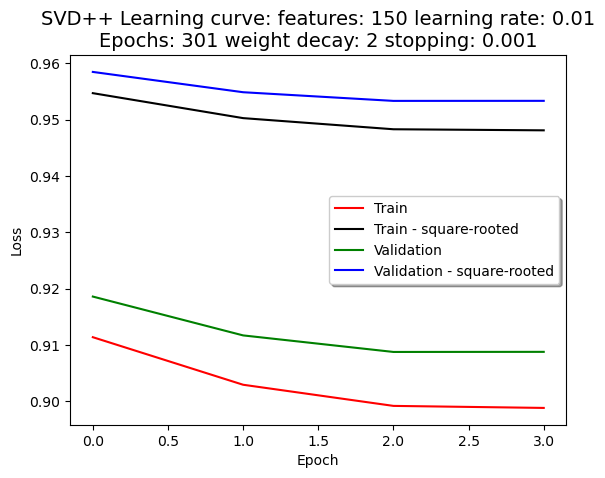

features: 150
learning rate: 0.001
Epochs: 301
weight decay: 0.02
stopping: 0.001



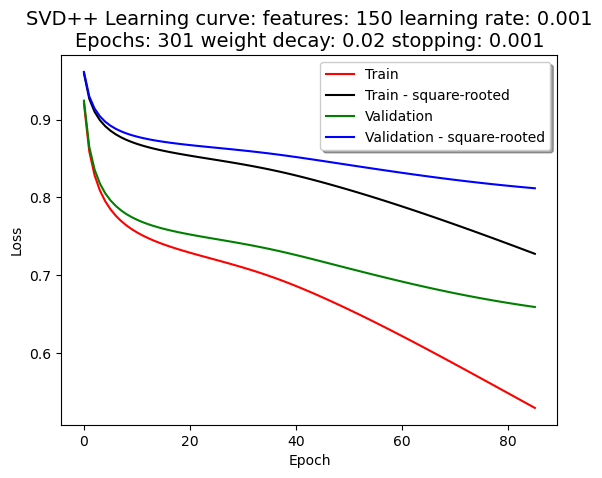

features: 150
learning rate: 0.001
Epochs: 301
weight decay: 0.2
stopping: 0.001



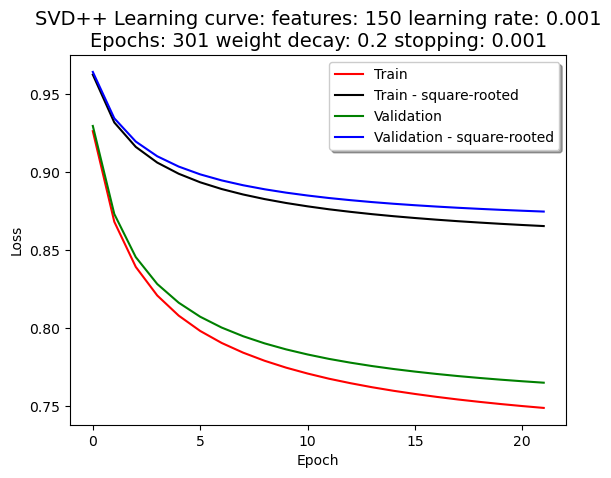

features: 150
learning rate: 0.001
Epochs: 301
weight decay: 2
stopping: 0.001



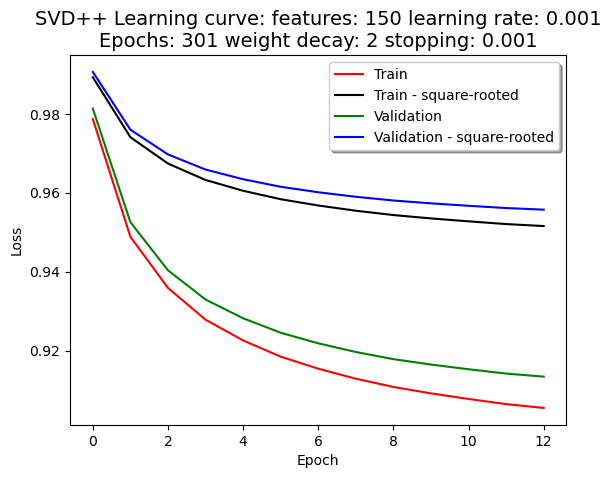

features: 150
learning rate: 0.0001
Epochs: 301
weight decay: 0.02
stopping: 0.001



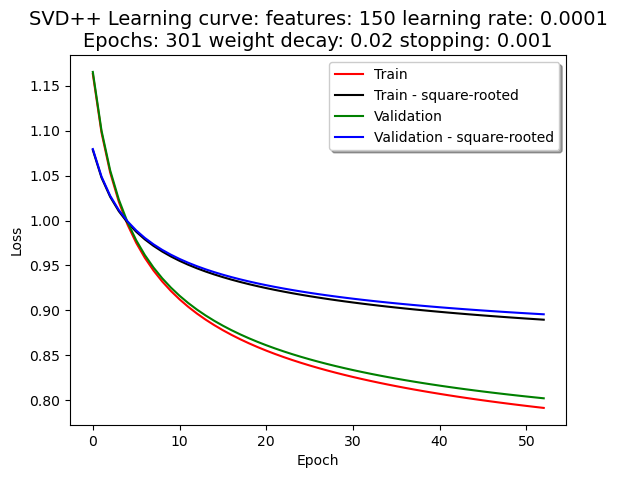

features: 150
learning rate: 0.0001
Epochs: 301
weight decay: 0.2
stopping: 0.001



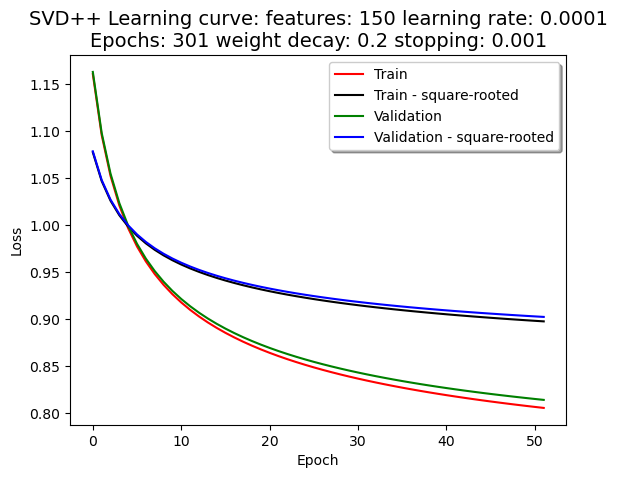

features: 150
learning rate: 0.0001
Epochs: 301
weight decay: 2
stopping: 0.001



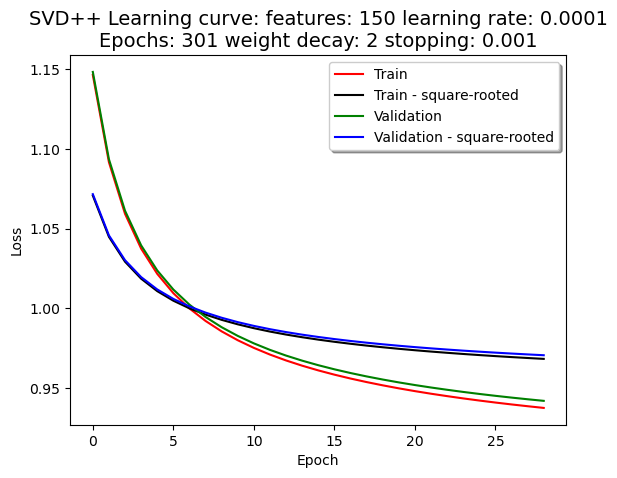

features: 300
learning rate: 0.01
Epochs: 301
weight decay: 0.02
stopping: 0.001



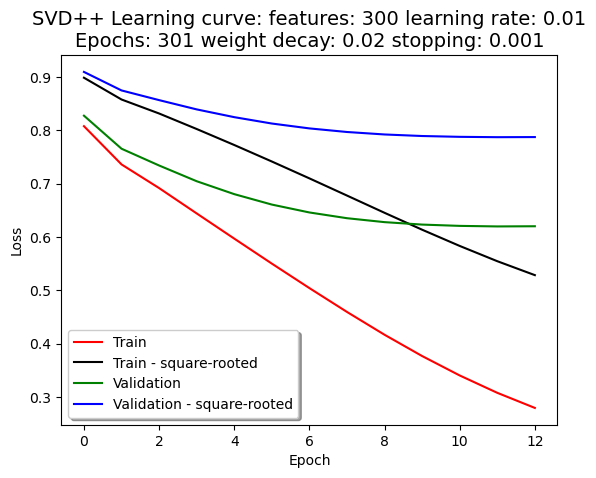

features: 300
learning rate: 0.01
Epochs: 301
weight decay: 0.2
stopping: 0.001



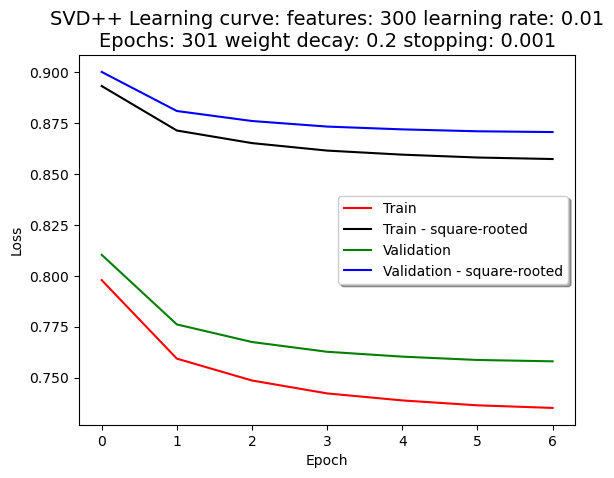

features: 300
learning rate: 0.01
Epochs: 301
weight decay: 2
stopping: 0.001



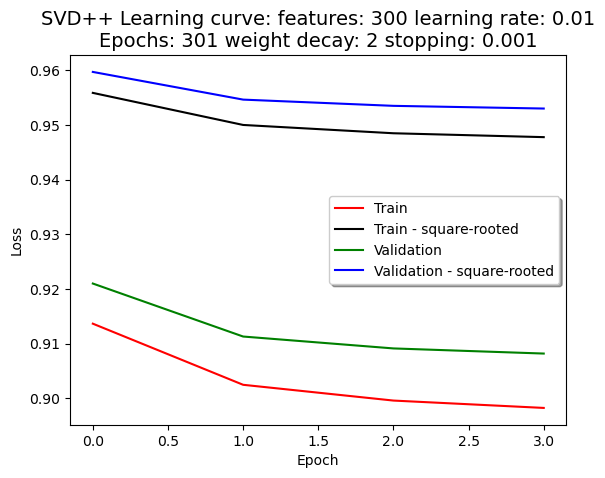

features: 300
learning rate: 0.001
Epochs: 301
weight decay: 0.02
stopping: 0.001



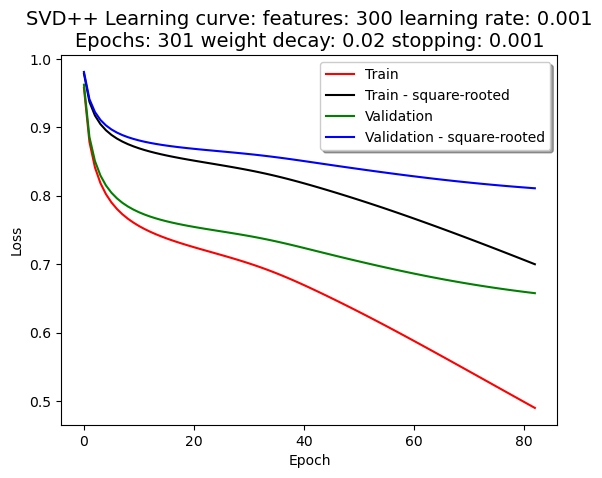

features: 300
learning rate: 0.001
Epochs: 301
weight decay: 0.2
stopping: 0.001



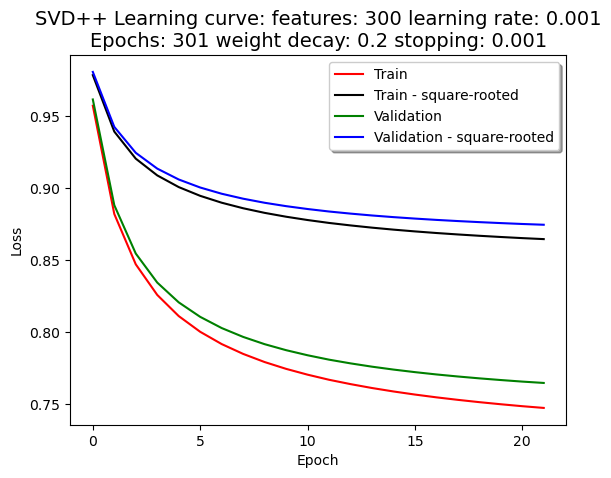

features: 300
learning rate: 0.001
Epochs: 301
weight decay: 2
stopping: 0.001



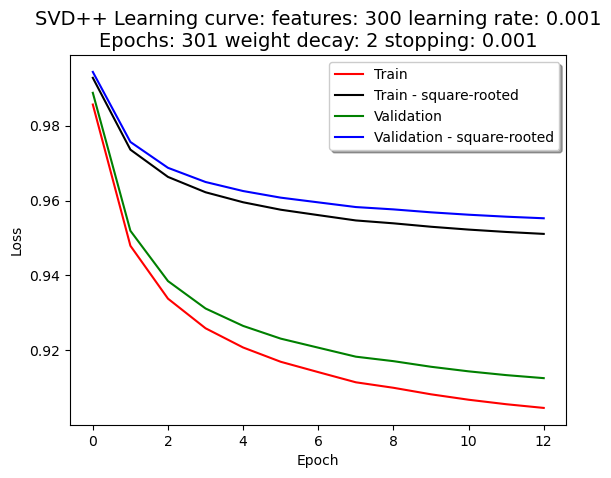

features: 300
learning rate: 0.0001
Epochs: 301
weight decay: 0.02
stopping: 0.001



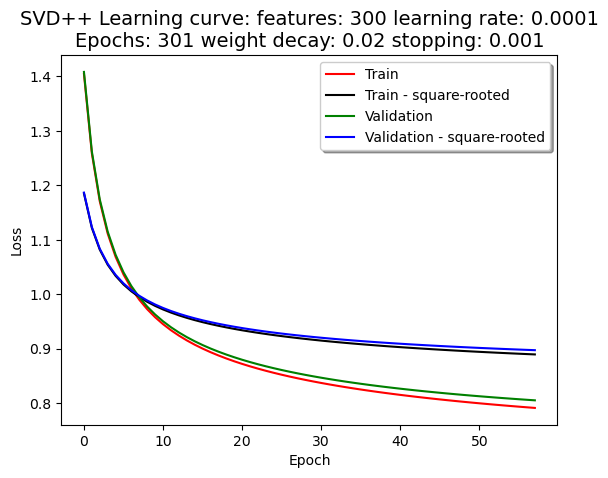

features: 300
learning rate: 0.0001
Epochs: 301
weight decay: 0.2
stopping: 0.001



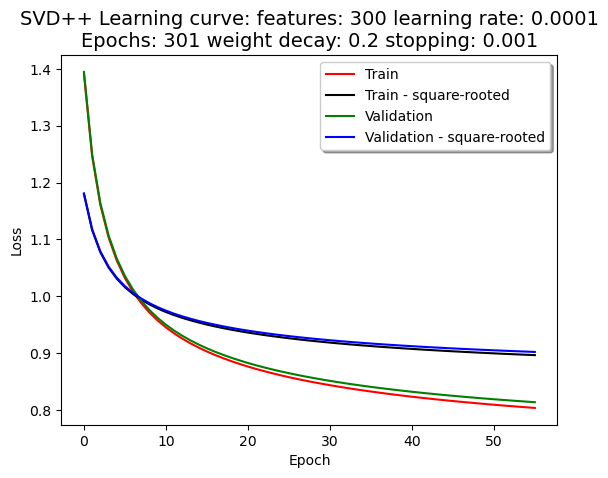

features: 300
learning rate: 0.0001
Epochs: 301
weight decay: 2
stopping: 0.001



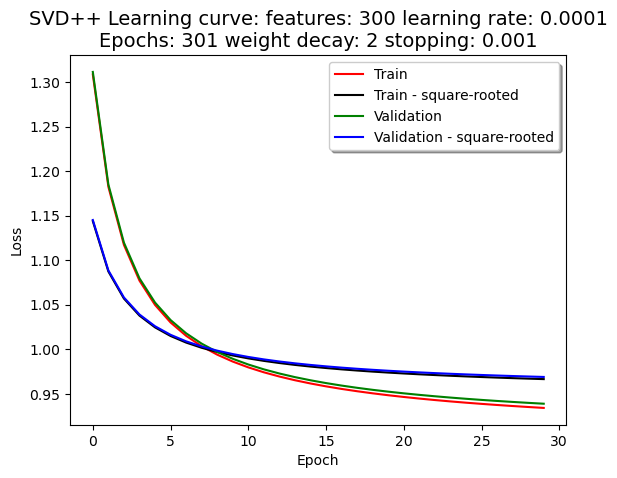

features: 3
learning rate: 0.01
Epochs: 501
weight decay: 0.02
stopping: 0.001



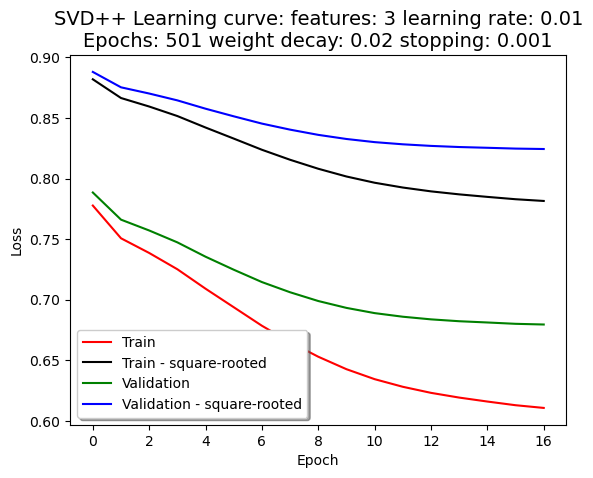

features: 3
learning rate: 0.01
Epochs: 501
weight decay: 0.2
stopping: 0.001



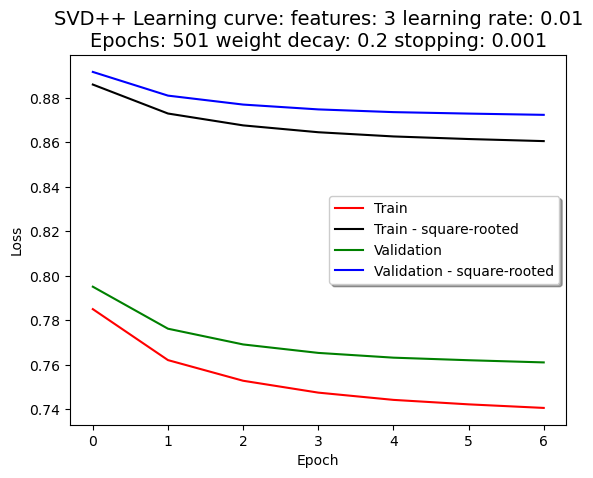

features: 3
learning rate: 0.01
Epochs: 501
weight decay: 2
stopping: 0.001



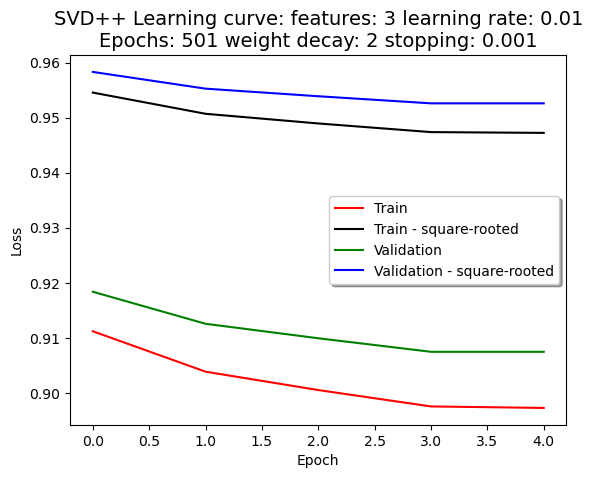

features: 3
learning rate: 0.001
Epochs: 501
weight decay: 0.02
stopping: 0.001



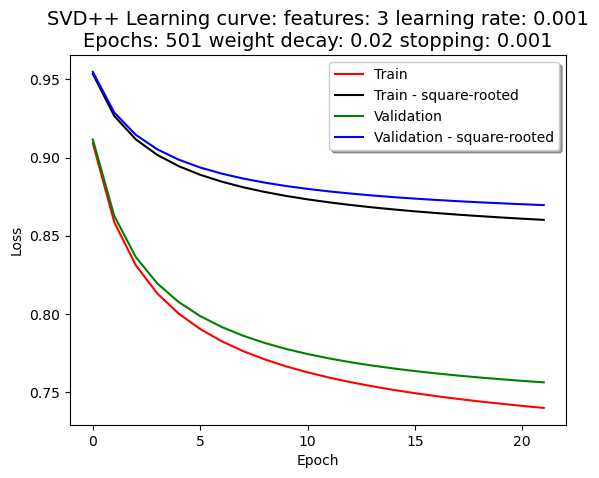

features: 3
learning rate: 0.001
Epochs: 501
weight decay: 0.2
stopping: 0.001



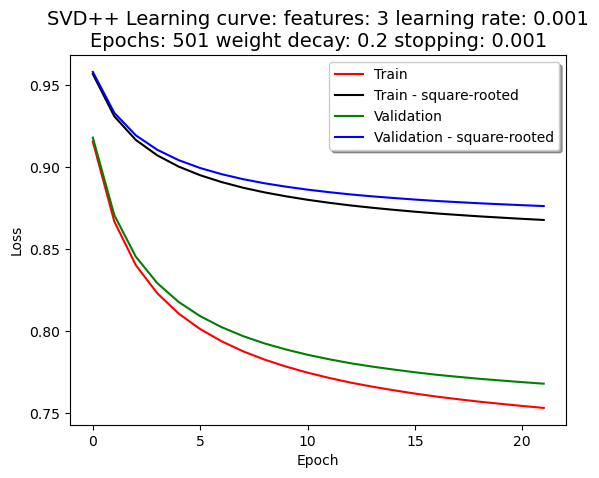

features: 3
learning rate: 0.001
Epochs: 501
weight decay: 2
stopping: 0.001



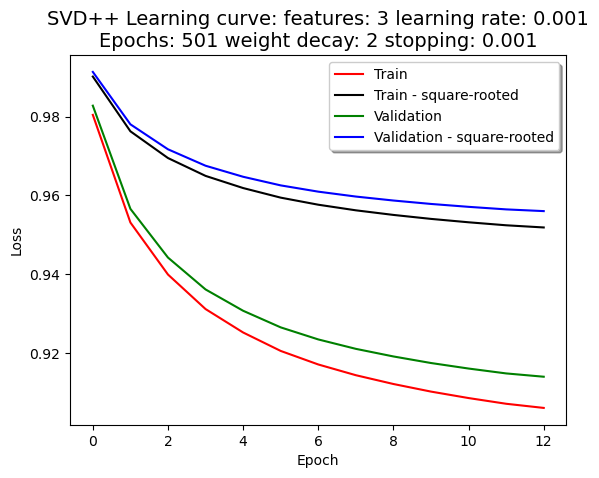

features: 3
learning rate: 0.0001
Epochs: 501
weight decay: 0.02
stopping: 0.001



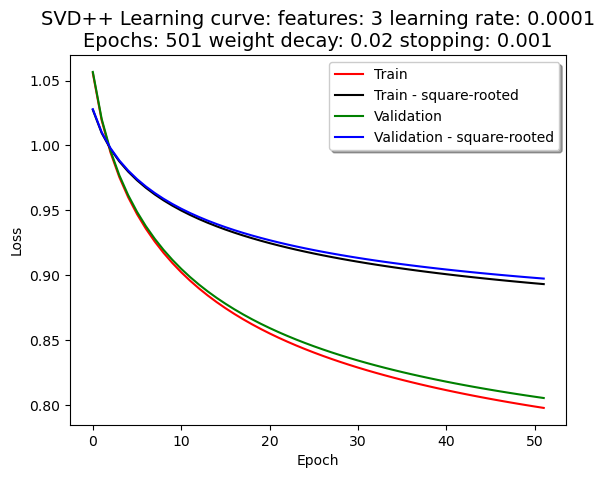

features: 3
learning rate: 0.0001
Epochs: 501
weight decay: 0.2
stopping: 0.001



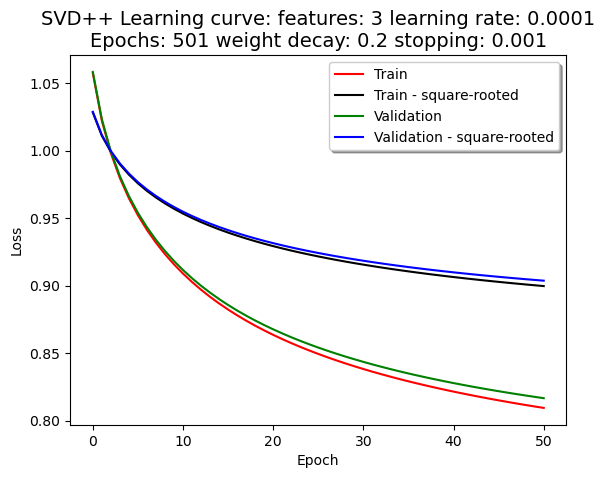

features: 3
learning rate: 0.0001
Epochs: 501
weight decay: 2
stopping: 0.001



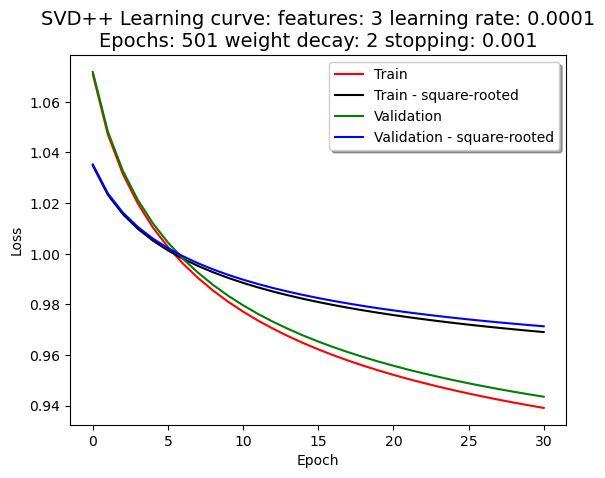

features: 30
learning rate: 0.01
Epochs: 501
weight decay: 0.02
stopping: 0.001



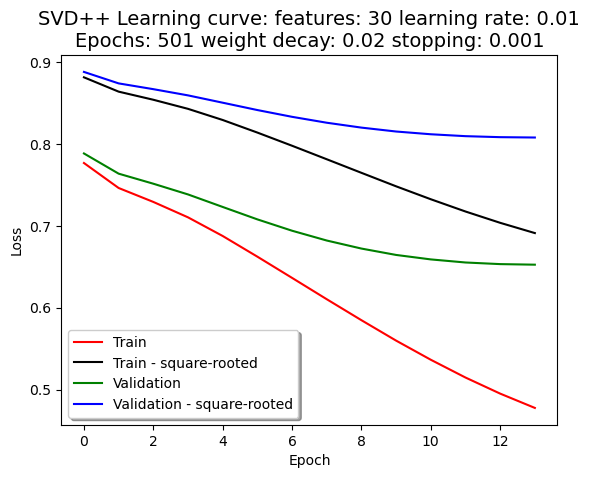

features: 30
learning rate: 0.01
Epochs: 501
weight decay: 0.2
stopping: 0.001



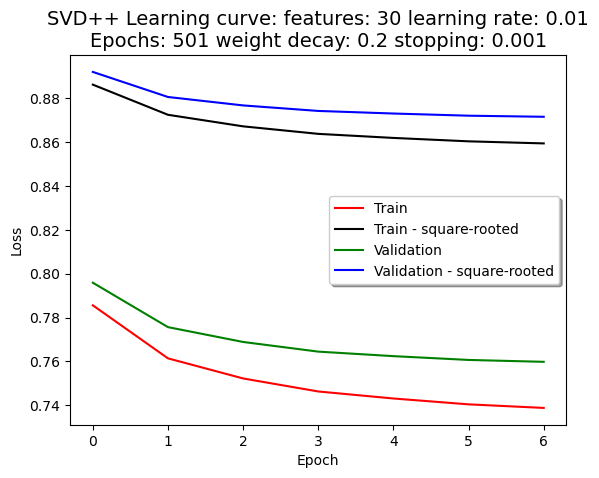

features: 30
learning rate: 0.01
Epochs: 501
weight decay: 2
stopping: 0.001



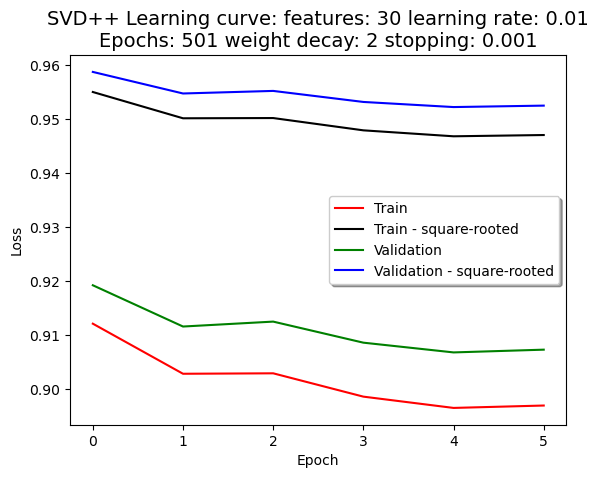

features: 30
learning rate: 0.001
Epochs: 501
weight decay: 0.02
stopping: 0.001



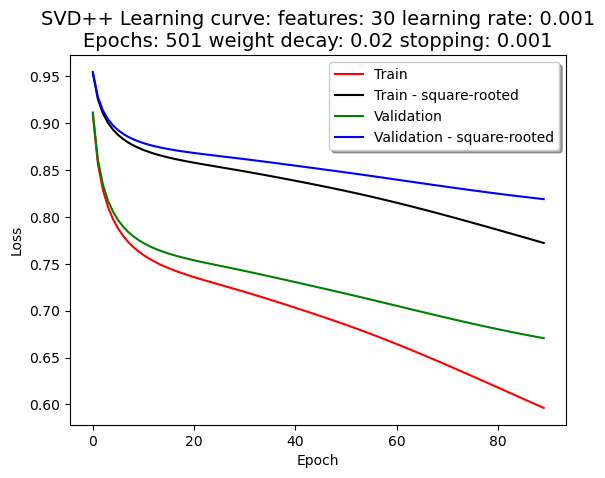

features: 30
learning rate: 0.001
Epochs: 501
weight decay: 0.2
stopping: 0.001



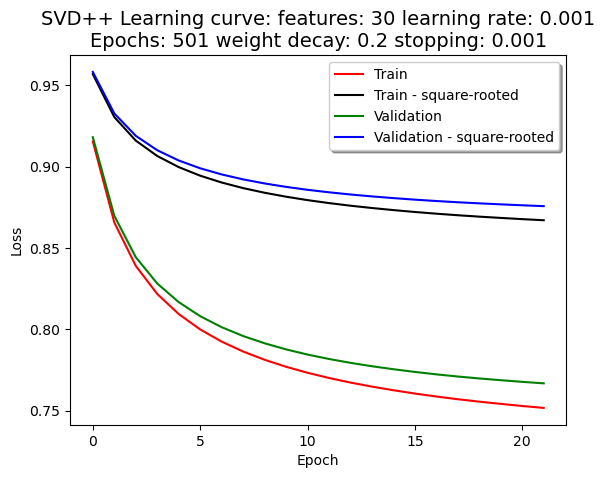

features: 30
learning rate: 0.001
Epochs: 501
weight decay: 2
stopping: 0.001



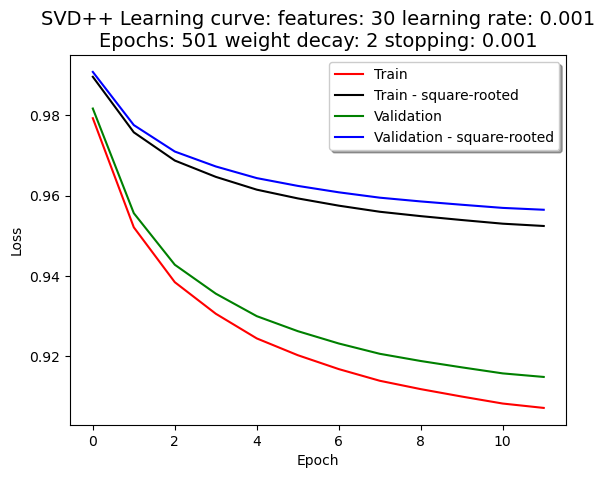

features: 30
learning rate: 0.0001
Epochs: 501
weight decay: 0.02
stopping: 0.001



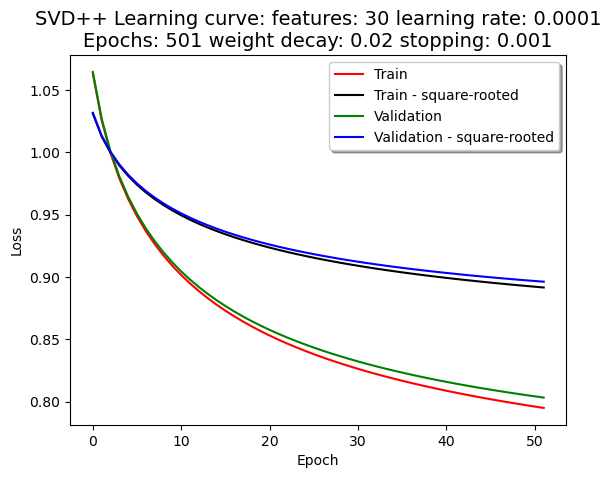

features: 30
learning rate: 0.0001
Epochs: 501
weight decay: 0.2
stopping: 0.001



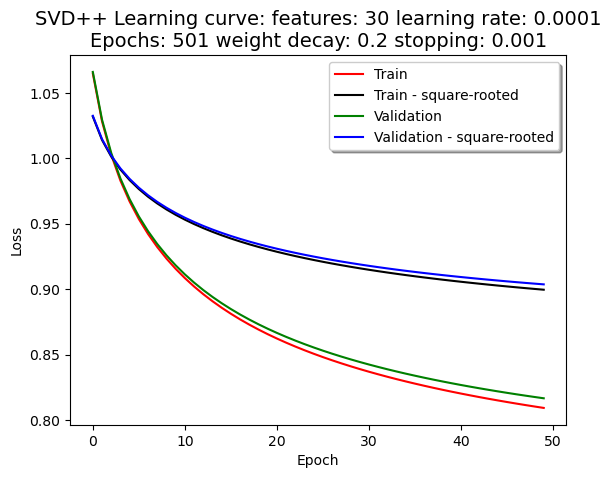

features: 30
learning rate: 0.0001
Epochs: 501
weight decay: 2
stopping: 0.001



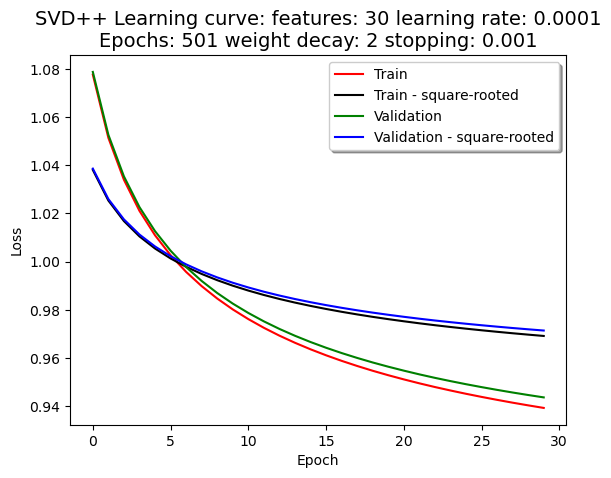

features: 150
learning rate: 0.01
Epochs: 501
weight decay: 0.02
stopping: 0.001



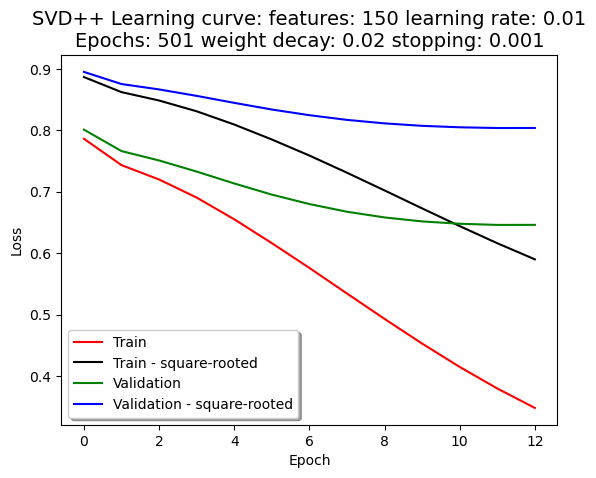

features: 150
learning rate: 0.01
Epochs: 501
weight decay: 0.2
stopping: 0.001



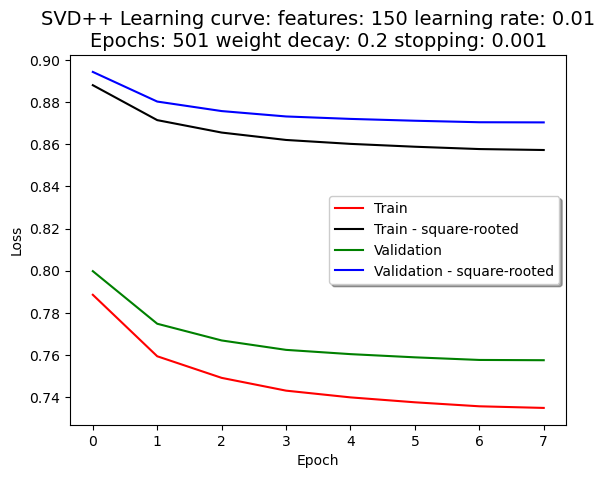

features: 150
learning rate: 0.01
Epochs: 501
weight decay: 2
stopping: 0.001



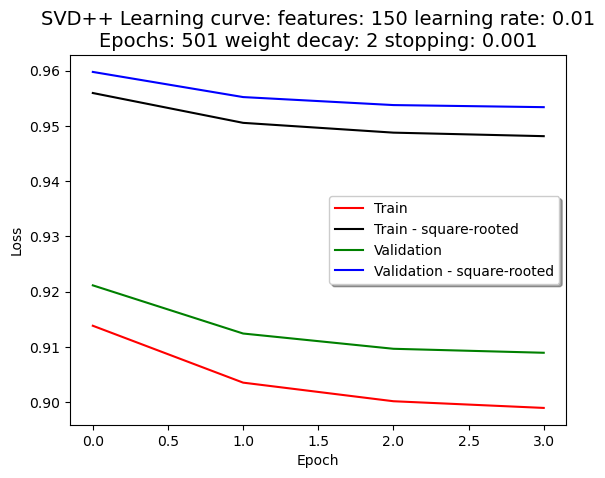

features: 150
learning rate: 0.001
Epochs: 501
weight decay: 0.02
stopping: 0.001



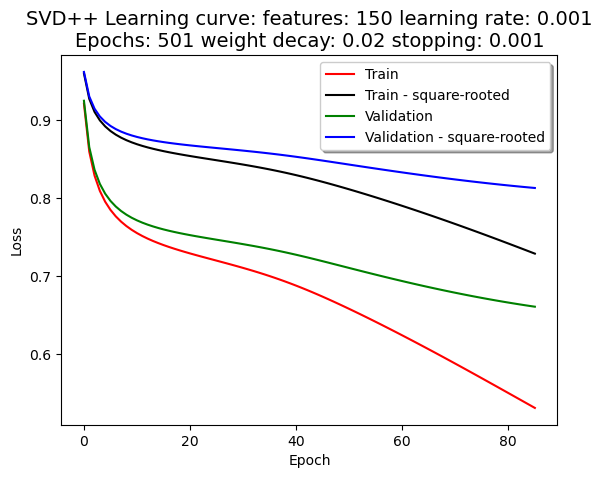

features: 150
learning rate: 0.001
Epochs: 501
weight decay: 0.2
stopping: 0.001



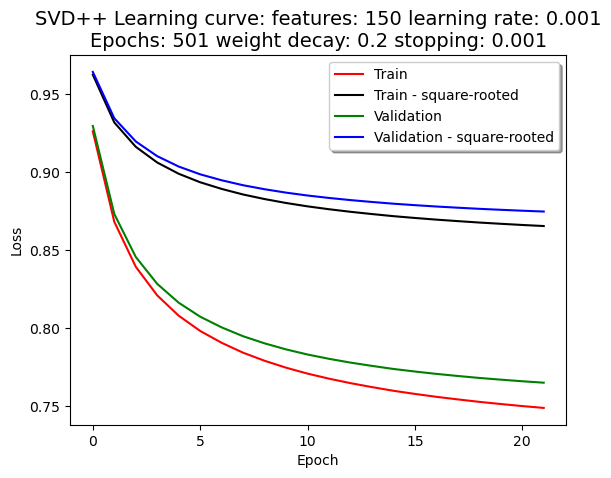

features: 150
learning rate: 0.001
Epochs: 501
weight decay: 2
stopping: 0.001



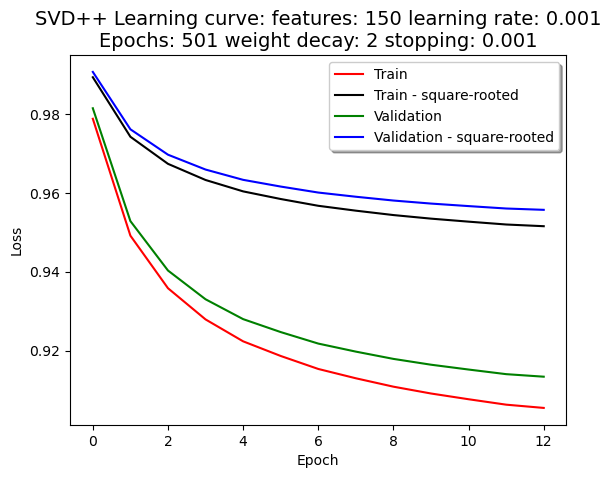

features: 150
learning rate: 0.0001
Epochs: 501
weight decay: 0.02
stopping: 0.001



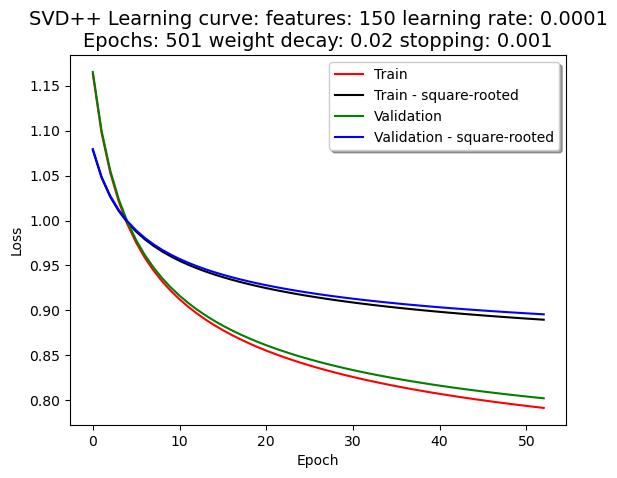

features: 150
learning rate: 0.0001
Epochs: 501
weight decay: 0.2
stopping: 0.001



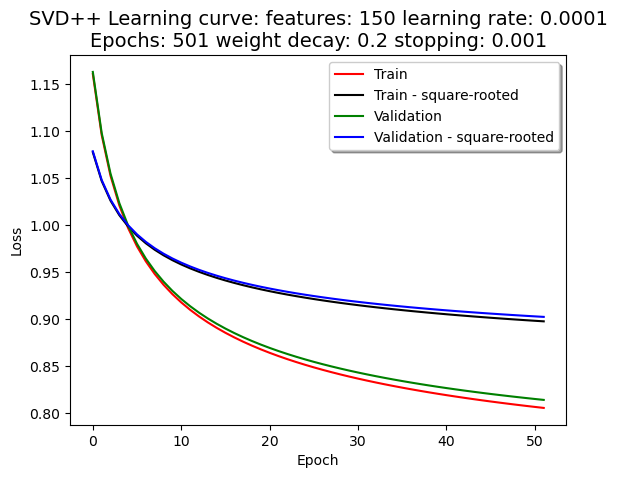

features: 150
learning rate: 0.0001
Epochs: 501
weight decay: 2
stopping: 0.001



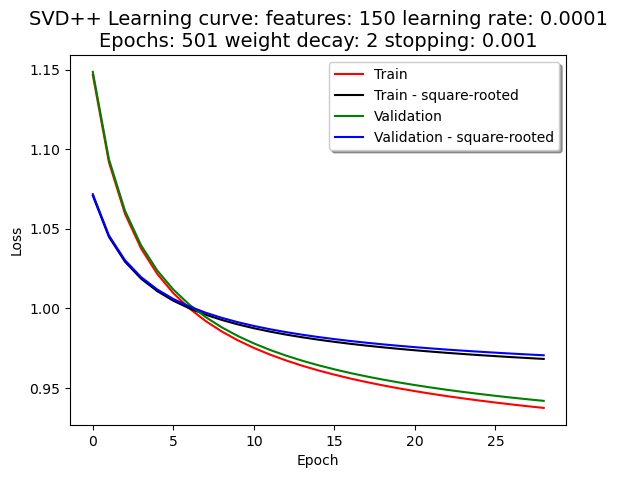

features: 300
learning rate: 0.01
Epochs: 501
weight decay: 0.02
stopping: 0.001



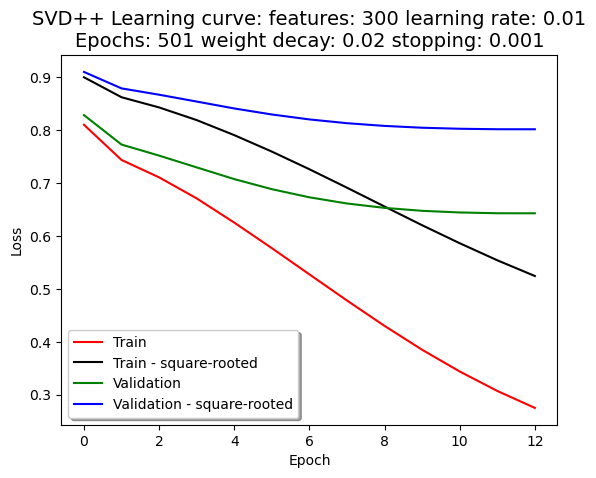

features: 300
learning rate: 0.01
Epochs: 501
weight decay: 0.2
stopping: 0.001



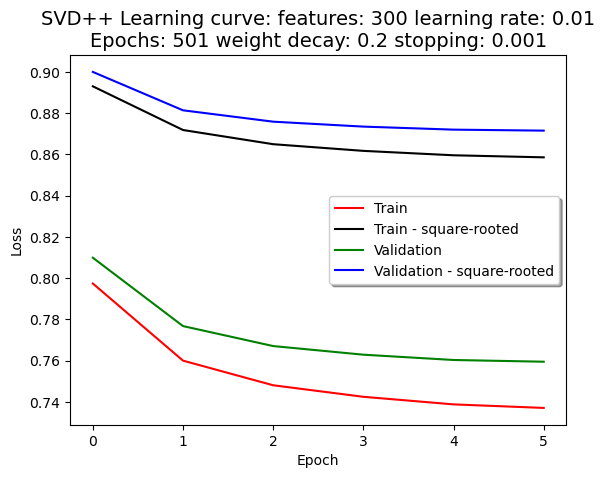

features: 300
learning rate: 0.01
Epochs: 501
weight decay: 2
stopping: 0.001



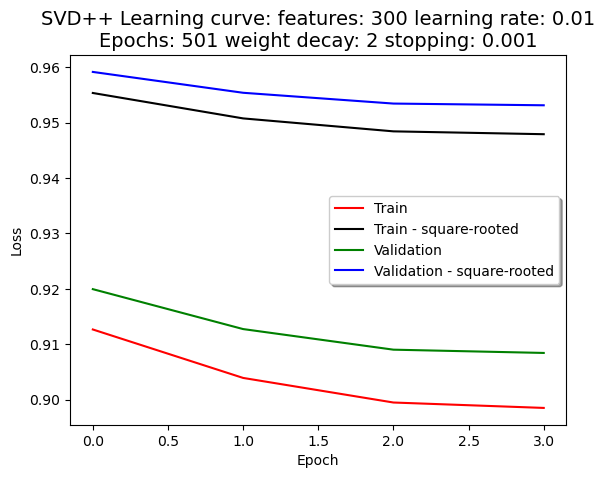

features: 300
learning rate: 0.001
Epochs: 501
weight decay: 0.02
stopping: 0.001



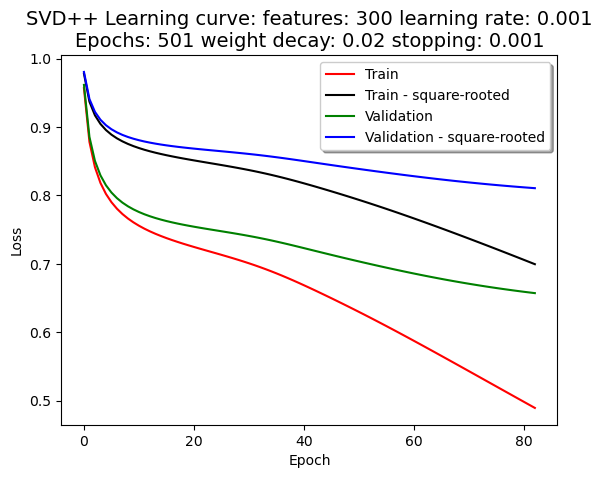

features: 300
learning rate: 0.001
Epochs: 501
weight decay: 0.2
stopping: 0.001



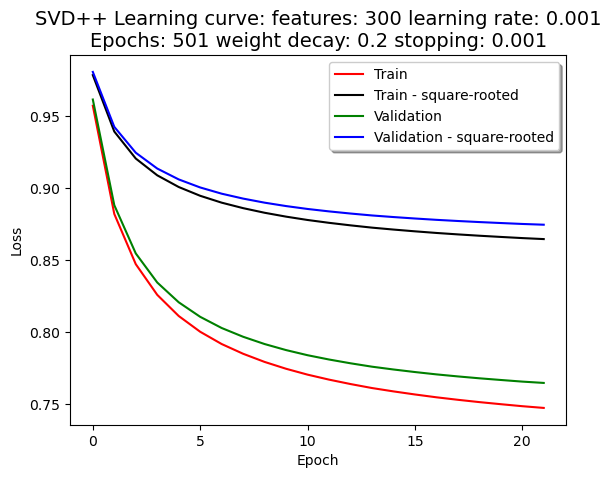

features: 300
learning rate: 0.001
Epochs: 501
weight decay: 2
stopping: 0.001



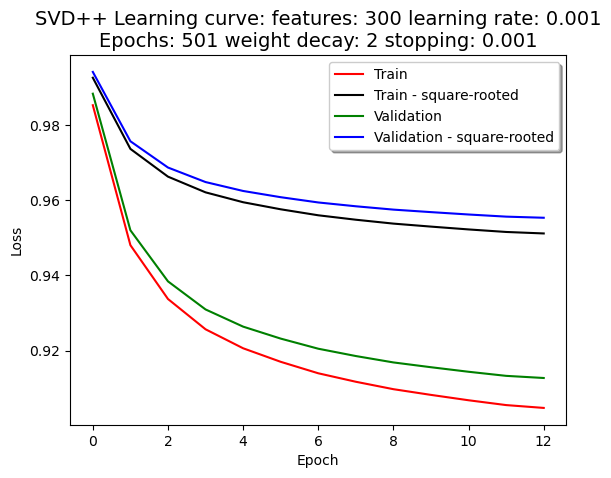

features: 300
learning rate: 0.0001
Epochs: 501
weight decay: 0.02
stopping: 0.001



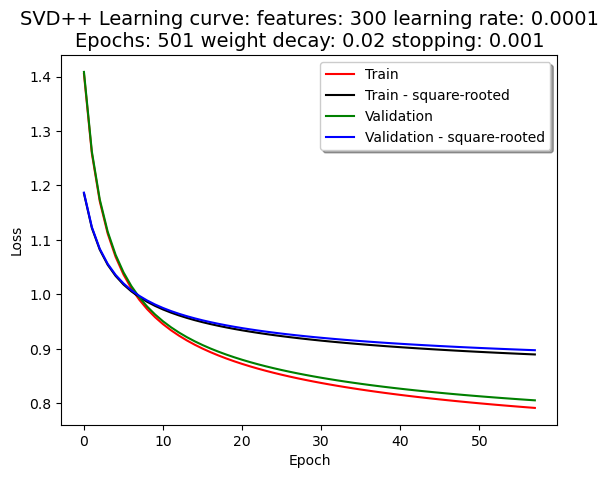

features: 300
learning rate: 0.0001
Epochs: 501
weight decay: 0.2
stopping: 0.001



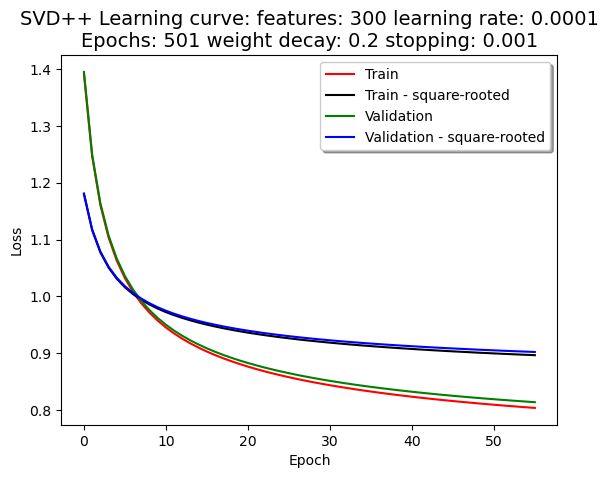

features: 300
learning rate: 0.0001
Epochs: 501
weight decay: 2
stopping: 0.001



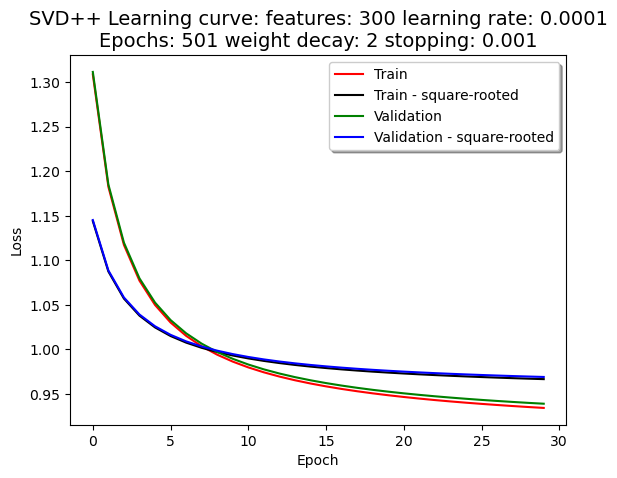

In [15]:
PARAM['features'] = [3, 30, 150, 300]
PARAM['lr'] = [1e-2, 1e-3, 1e-4]
PARAM['epochs'] = [11, 101, 201, 301, 501]
PARAM['weight_decay'] = [0.02, 0.2, 2]
PARAM['stopping'] = 0.001

from textwrap import wrap
for epochs in PARAM['epochs']:
    for features in PARAM['features']:
        for lr in PARAM['lr']:
            for weight_decay in PARAM['weight_decay']:
                if os.path.isfile(f'./model_movielens/svdpp/result/{features}_{lr}_{epochs}_{weight_decay}_0.001.pkl'):
#                     with open(f'./model_movielens/svdpp/model/{features}_{lr}_{epochs}_{weight_decay}_0.001.pkl', 'rb') as inp:
#                         svd = pickle.load(inp)
#                         print(f'\nfeatures: {svd.features}\nlearning rate: {svd.lr}\nEpochs: {svd.epochs}\nweight decay: {svd.weight_decay}\nstopping: 0.001\n')
#                         inp.close()
                    with open(f'./model_movielens/svdpp/result/{features}_{lr}_{epochs}_{weight_decay}_0.001.pkl', 'rb') as inp:
                        print(f'features: {features}\nlearning rate: {lr}\nEpochs: {epochs}\nweight decay: {weight_decay}\nstopping: 0.001\n')
                        k=0
                        result = pickle.load(inp)
                        # print('RMSE')
                        # print(np.sqrt(sum(np.array(result[2])**2/len(result[2]))))
                        plt.plot(list(range(len(result[0])))[-k:], result[0][-k:], 'r', label="Train")
                        plt.plot(list(range(len(result[0])))[-k:], np.sqrt(result[0][-k:]), '#000', label="Train - square-rooted")
                        plt.plot(list(range(len(result[1])))[-k:], result[1][-k:], 'g', label="Validation")
                        plt.plot(list(range(len(result[1])))[-k:], np.sqrt(result[1][-k:]), 'b', label="Validation - square-rooted")
                        title = f"SVD++ Learning curve: features: {features} learning rate: {lr} Epochs: {epochs} weight decay: {weight_decay} stopping: {PARAM['stopping']}"
                        plt.title('\n'.join(wrap(title,60)), fontsize=14)
                        plt.xlabel('Epoch')
                        plt.ylabel('Loss')
                        leg = plt.legend(loc='best', shadow=True, fancybox=True)
                        plt.savefig(f"./model_movielens/svdpp/plt_images/{features}_{lr}_{epochs}_{weight_decay}_0.001.png")
                        plt.show()
                        inp.close()

In [17]:
minTrainLoss = float('+inf')
minValidLoss = float('+inf')
minTestLoss = float('+inf')

bestTrainLossModel = ''
bestValidLossModel = ''
bestTestLossModel = ''

for epochs in PARAM['epochs']:
    for features in PARAM['features']:
        for lr in PARAM['lr']:
            for weight_decay in PARAM['weight_decay']:
                if os.path.isfile(f'./model_movielens/svdpp/result/{features}_{lr}_{epochs}_{weight_decay}_0.001.pkl'):
#                     with open(f'./model_movielens/svdpp/model/{features}_{lr}_{epochs}_{weight_decay}_0.001.pkl', 'rb') as inp:
#                         svd = pickle.load(inp)
#                         print(f'\nfeatures: {svd.features}\nlearning rate: {svd.lr}\nEpochs: {svd.epochs}\nweight decay: {svd.weight_decay}\nstopping: 0.001\n')
#                         inp.close()
                    with open(f'./model_movielens/svdpp/result/{features}_{lr}_{epochs}_{weight_decay}_0.001.pkl', 'rb') as inp:
                        # print(f'features: {features}\nlearning rate: {lr}\nEpochs: {epochs}\nweight decay: {weight_decay}\nstopping: 0.001\n')
                        # k=0
                        result = pickle.load(inp)
                        lastTrainLoss = result[0][-1]
                        lastValidLoss = result[1][-1]
                        lastTestLoss = result[2]
                        if lastTrainLoss < minTrainLoss:
                            minTrainLoss = lastTrainLoss
                            bestTrainLossModel = f'features: {features}\nlearning rate: {lr}\nEpochs: {epochs}\nweight decay: {weight_decay}\nstopping: 0.001\n'
                            bestTrainLossModel += f'lastTrainLoss: {lastTrainLoss}\tlastValidLoss: {lastValidLoss}\tlastTestLoss: {lastTestLoss}\n'
                        
                        if lastValidLoss < minValidLoss:
                            minValidLoss = lastValidLoss
                            bestValidLossModel = f'features: {features}\nlearning rate: {lr}\nEpochs: {epochs}\nweight decay: {weight_decay}\nstopping: 0.001\n'
                            bestValidLossModel += f'lastTrainLoss: {lastTrainLoss}\tlastValidLoss: {lastValidLoss}\tlastTestLoss: {lastTestLoss}\n'
                        
                        if lastTestLoss < minTestLoss:
                            minTestLoss = lastTestLoss
                            bestTestLossModel = f'features: {features}\nlearning rate: {lr}\nEpochs: {epochs}\nweight decay: {weight_decay}\nstopping: 0.001\n'
                            bestTestLossModel += f'lastTrainLoss: {lastTrainLoss}\tlastValidLoss: {lastValidLoss}\tlastTestLoss: {lastTestLoss}\n'
                        
                        
                        inp.close()

print(f'bestTrainLossModel\n{bestTrainLossModel}')
print(f'minTrainLoss: {minTrainLoss}')

print(f'bestValidLossModel\n{bestValidLossModel}')
print(f'minValidLoss: {minValidLoss}')

print(f'bestTestLossModel\n{bestTestLossModel}')
print(f'minTestLoss: {minTestLoss}')

bestTrainLossModel
features: 300
learning rate: 0.01
Epochs: 501
weight decay: 0.02
stopping: 0.001
lastTrainLoss: 0.27510244851174104	lastValidLoss: 0.6430561290455903	lastTestLoss: 0.6436416464826317

minTrainLoss: 0.27510244851174104
bestValidLossModel
features: 300
learning rate: 0.01
Epochs: 301
weight decay: 0.02
stopping: 0.001
lastTrainLoss: 0.2791537355112236	lastValidLoss: 0.6200949522339392	lastTestLoss: 0.6178984940371097

minValidLoss: 0.6200949522339392
bestTestLossModel
features: 300
learning rate: 0.01
Epochs: 301
weight decay: 0.02
stopping: 0.001
lastTrainLoss: 0.2791537355112236	lastValidLoss: 0.6200949522339392	lastTestLoss: 0.6178984940371097

minTestLoss: 0.6178984940371097


In [9]:
movieRatePredictionByUserIdMovieId(1, 1, svd)

3.718006361336834

In [11]:
topKPrediction(1, 10, svd)

[(6589, 4.505884111277137),
 (3846, 4.451383961147307),
 (6774, 4.440699978178808),
 (11274, 4.393581614130565),
 (13669, 4.354175950926482),
 (11346, 4.342153452128488),
 (2481, 4.337973454536605),
 (5905, 4.305563684301346),
 (8566, 4.303227452391614),
 (1172, 4.300074835537527)]